# <div style="text-align: center">Отток клиентов банка.</div>

## Описание проекта.
Из «Бета-Банка» стали уходить клиенты. Банковские маркетологи посчитали: сохранять текущих клиентов дешевле, чем привлекать новых.

Нужно спрогнозировать, уйдёт клиент из банка в ближайшее время или нет. Нам предоставлены исторические данные о поведении клиентов и расторжении договоров с банком. <br>

- **Заказчик:**
«Бета-Банк».<br><br>

- **Источник данных:** [https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling](https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling)<br><br>

- **Цели и план работы:**<br><br>
  - **Цели работы:**
    - Решение задачи бинарной классификации с использованием моделей обучения с учителем путём
      - обработки дисбаланса классов,
      - подбора оптимальных гиперпараметров,
      - обучения и оценки моделей с точки зрения целевой метрики - `f1`-меры.
    - Достижение значения целевой метрики `f1` не ниже `0.59`.
    - Измерение `AUC-ROC` и сравнение её значения с `f1`-мерой.<br><br>

  - **План работы:**
<div class="toc"><ul class="toc-item"><li><span><a href="#Описание-проекта." data-toc-modified-id="Описание-проекта.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Описание проекта.</a></span></li><li><span><a href="#Загрузка-используемых-библиотек." data-toc-modified-id="Загрузка-используемых-библиотек.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Загрузка используемых библиотек.</a></span></li><li><span><a href="#Установка-параметров." data-toc-modified-id="Установка-параметров.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Установка параметров.</a></span></li><li><span><a href="#Загрузка-данных." data-toc-modified-id="Загрузка-данных.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Загрузка данных.</a></span></li><li><span><a href="#Ознакомление,-исследовательский-анализ-и-предобработка-данных." data-toc-modified-id="Ознакомление,-исследовательский-анализ-и-предобработка-данных.-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Ознакомление, исследовательский анализ и предобработка данных.</a></span><ul class="toc-item"><li><span><a href="#Общая-информация-о-данных-и-исследовательский-анализ." data-toc-modified-id="Общая-информация-о-данных-и-исследовательский-анализ.-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Общая информация о данных и исследовательский анализ.</a></span><ul class="toc-item"><li><span><a href="#Создание-функций-для-ИАД." data-toc-modified-id="Создание-функций-для-ИАД.-5.1.1"><span class="toc-item-num">5.1.1&nbsp;&nbsp;</span>Создание функций для ИАД.</a></span></li><li><span><a href="#Вывод-информации-о-датафрейме." data-toc-modified-id="Вывод-информации-о-датафрейме.-5.1.2"><span class="toc-item-num">5.1.2&nbsp;&nbsp;</span>Вывод информации о датафрейме.</a></span></li><li><span><a href="#Исследовательский-анализ-данных.-Выводы:" data-toc-modified-id="Исследовательский-анализ-данных.-Выводы:-5.1.3"><span class="toc-item-num">5.1.3&nbsp;&nbsp;</span><strong>Исследовательский анализ данных. Выводы:</strong></a></span></li></ul></li><li><span><a href="#Предобработка-данных." data-toc-modified-id="Предобработка-данных.-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Предобработка данных.</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков." data-toc-modified-id="Обработка-пропусков.-5.2.1"><span class="toc-item-num">5.2.1&nbsp;&nbsp;</span>Обработка пропусков.</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков.-Промежуточные-выводы:" data-toc-modified-id="Обработка-пропусков.-Промежуточные-выводы:-5.2.1.1"><span class="toc-item-num">5.2.1.1&nbsp;&nbsp;</span>Обработка пропусков. Промежуточные выводы:</a></span></li><li><span><a href="#Обработка-пропусков.-Выводы:" data-toc-modified-id="Обработка-пропусков.-Выводы:-5.2.1.2"><span class="toc-item-num">5.2.1.2&nbsp;&nbsp;</span><strong>Обработка пропусков. Выводы:</strong></a></span></li></ul></li><li><span><a href="#Обработка-дубликатов." data-toc-modified-id="Обработка-дубликатов.-5.2.2"><span class="toc-item-num">5.2.2&nbsp;&nbsp;</span>Обработка дубликатов.</a></span><ul class="toc-item"><li><span><a href="#Обработка-дубликатов.-Выводы:" data-toc-modified-id="Обработка-дубликатов.-Выводы:-5.2.2.1"><span class="toc-item-num">5.2.2.1&nbsp;&nbsp;</span><strong>Обработка дубликатов. Выводы:</strong></a></span></li></ul></li><li><span><a href="#Удаление-неинформативных-признаков." data-toc-modified-id="Удаление-неинформативных-признаков.-5.2.3"><span class="toc-item-num">5.2.3&nbsp;&nbsp;</span>Удаление неинформативных признаков.</a></span></li></ul></li></ul></li><li><span><a href="#Подготовка-данных-к-моделированию." data-toc-modified-id="Подготовка-данных-к-моделированию.-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Подготовка данных к моделированию.</a></span><ul class="toc-item"><li><span><a href="#Разделение-на-выборки." data-toc-modified-id="Разделение-на-выборки.-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Разделение на выборки.</a></span><ul class="toc-item"><li><span><a href="#Создание-функции-разделения-на-выборки." data-toc-modified-id="Создание-функции-разделения-на-выборки.-6.1.1"><span class="toc-item-num">6.1.1&nbsp;&nbsp;</span>Создание функции разделения на выборки.</a></span></li><li><span><a href="#Разделение-на-выборки." data-toc-modified-id="Разделение-на-выборки.-6.1.2"><span class="toc-item-num">6.1.2&nbsp;&nbsp;</span>Разделение на выборки.</a></span></li><li><span><a href="#Разделение-выборок.-Выводы:" data-toc-modified-id="Разделение-выборок.-Выводы:-6.1.3"><span class="toc-item-num">6.1.3&nbsp;&nbsp;</span><strong>Разделение выборок. Выводы:</strong></a></span></li></ul></li><li><span><a href="#Кодирование-и-масштабирование-признаков." data-toc-modified-id="Кодирование-и-масштабирование-признаков.-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Кодирование и масштабирование признаков.</a></span><ul class="toc-item"><li><span><a href="#Создание-функции-кодирования-/-масштабирования-признаков." data-toc-modified-id="Создание-функции-кодирования-/-масштабирования-признаков.-6.2.1"><span class="toc-item-num">6.2.1&nbsp;&nbsp;</span>Создание функции кодирования / масштабирования признаков.</a></span></li><li><span><a href="#Кодирование-и-масштабирование-признаков." data-toc-modified-id="Кодирование-и-масштабирование-признаков.-6.2.2"><span class="toc-item-num">6.2.2&nbsp;&nbsp;</span>Кодирование и масштабирование признаков.</a></span></li><li><span><a href="#Кодирование-и-масштабирование-признаков.-Выводы" data-toc-modified-id="Кодирование-и-масштабирование-признаков.-Выводы-6.2.3"><span class="toc-item-num">6.2.3&nbsp;&nbsp;</span><strong>Кодирование и масштабирование признаков. Выводы</strong></a></span></li></ul></li><li><span><a href="#Проверка-значимости-признаков." data-toc-modified-id="Проверка-значимости-признаков.-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Проверка значимости признаков.</a></span><ul class="toc-item"><li><span><a href="#Создание-функции-проверки-значимости." data-toc-modified-id="Создание-функции-проверки-значимости.-6.3.1"><span class="toc-item-num">6.3.1&nbsp;&nbsp;</span>Создание функции проверки значимости.</a></span></li><li><span><a href="#Проверка-значимости." data-toc-modified-id="Проверка-значимости.-6.3.2"><span class="toc-item-num">6.3.2&nbsp;&nbsp;</span>Проверка значимости.</a></span></li><li><span><a href="#Проверка-значимости-признаков.-Выводы:" data-toc-modified-id="Проверка-значимости-признаков.-Выводы:-6.3.3"><span class="toc-item-num">6.3.3&nbsp;&nbsp;</span><strong>Проверка значимости признаков. Выводы:</strong></a></span></li></ul></li></ul></li><li><span><a href="#Исследование-баланса-классов." data-toc-modified-id="Исследование-баланса-классов.-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Исследование баланса классов.</a></span><ul class="toc-item"><li><span><a href="#Создание-функции-поиска-оптимальных-гиперпараметров." data-toc-modified-id="Создание-функции-поиска-оптимальных-гиперпараметров.-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Создание функции поиска оптимальных гиперпараметров.<br></a></span></li><li><span><a href="#Установка-параметров-обучения-моделей." data-toc-modified-id="Установка-параметров-обучения-моделей.-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Установка параметров обучения моделей.</a></span></li><li><span><a href="#Обучение-модели-без-учета-дисбаланса." data-toc-modified-id="Обучение-модели-без-учета-дисбаланса.-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Обучение модели без учета дисбаланса.</a></span><ul class="toc-item"><li><span><a href="#Обучение-модели-без-учёта-дисбаланса.-Выводы:" data-toc-modified-id="Обучение-модели-без-учёта-дисбаланса.-Выводы:-7.3.1"><span class="toc-item-num">7.3.1&nbsp;&nbsp;</span><strong>Обучение модели без учёта дисбаланса. Выводы:</strong></a></span></li></ul></li></ul></li><li><span><a href="#Борьба-с-дисбалансом." data-toc-modified-id="Борьба-с-дисбалансом.-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Борьба с дисбалансом.</a></span><ul class="toc-item"><li><span><a href="#Параметр-class_weight-для-борьбы-с-дисбалансом." data-toc-modified-id="Параметр-class_weight-для-борьбы-с-дисбалансом.-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>Параметр <code>class_weight</code> для борьбы с дисбалансом.</a></span><ul class="toc-item"><li><span><a href="#Параметр-class_weight.-Выводы:" data-toc-modified-id="Параметр-class_weight.-Выводы:-8.1.1"><span class="toc-item-num">8.1.1&nbsp;&nbsp;</span>Параметр <code>class_weight</code>. Выводы:</a></span></li></ul></li><li><span><a href="#Создание-функции-ресэмплинга-выборок." data-toc-modified-id="Создание-функции-ресэмплинга-выборок.-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Создание функции ресэмплинга выборок.</a></span></li><li><span><a href="#Увеличение-выборки-для-борьбы-с-дисбалансом." data-toc-modified-id="Увеличение-выборки-для-борьбы-с-дисбалансом.-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>Увеличение выборки для борьбы с дисбалансом.</a></span><ul class="toc-item"><li><span><a href="#Увеличение-выборки.-Выводы:" data-toc-modified-id="Увеличение-выборки.-Выводы:-8.3.1"><span class="toc-item-num">8.3.1&nbsp;&nbsp;</span>Увеличение выборки. Выводы:</a></span></li></ul></li><li><span><a href="#Уменьшение-выборки-для-борьбы-с-дисбалансом." data-toc-modified-id="Уменьшение-выборки-для-борьбы-с-дисбалансом.-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>Уменьшение выборки для борьбы с дисбалансом.</a></span><ul class="toc-item"><li><span><a href="#Уменьшение-выборки.-Выводы:" data-toc-modified-id="Уменьшение-выборки.-Выводы:-8.4.1"><span class="toc-item-num">8.4.1&nbsp;&nbsp;</span>Уменьшение выборки. Выводы:</a></span></li></ul></li><li><span><a href="#Изменение-порога-классификации-для-борьбы-с-дисбалансом." data-toc-modified-id="Изменение-порога-классификации-для-борьбы-с-дисбалансом.-8.5"><span class="toc-item-num">8.5&nbsp;&nbsp;</span>Изменение порога классификации для борьбы с дисбалансом.</a></span><ul class="toc-item"><li><span><a href="#Изменение-порога-классификации.-Выводы:" data-toc-modified-id="Изменение-порога-классификации.-Выводы:-8.5.1"><span class="toc-item-num">8.5.1&nbsp;&nbsp;</span>Изменение порога классификации. Выводы:</a></span></li></ul></li><li><span><a href="#Борьба-с-дисбалансом.-Выводы:" data-toc-modified-id="Борьба-с-дисбалансом.-Выводы:-8.6"><span class="toc-item-num">8.6&nbsp;&nbsp;</span>Борьба с дисбалансом. Выводы:</a></span></li></ul></li><li><span><a href="#Тестирование-модели." data-toc-modified-id="Тестирование-модели.-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Тестирование модели.</a></span></li><li><span><a href="#Общие-выводы:" data-toc-modified-id="Общие-выводы:-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Общие выводы:</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Исследовательский-анализ-данных.-Выводы:" data-toc-modified-id="Исследовательский-анализ-данных.-Выводы:-10.0.1"><span class="toc-item-num">10.0.1&nbsp;&nbsp;</span><strong>Исследовательский анализ данных. Выводы:</strong></a></span></li></ul></li></ul></li><li><span><a href="#Чек-лист-готовности-проекта" data-toc-modified-id="Чек-лист-готовности-проекта-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Чек-лист готовности проекта</a></span></li></ul></div>
<br>



- **Описание признаков:**<br>
  - предикторы содержат информацию о клиентах;
  - целевой/объясняемый признак содержит информацию об оттоке клиентов.

| Наименование признака | Тип признака | Описание признака
| :- | :- | :-
| **Предикторы:** |
| `RowNumber` | - |индекс строки в данных
| `CustomerId` | - | уникальный идентификатор клиента
| `Surname` | категориальный | фамилия
| `CreditScore` | количественный | кредитный рейтинг
| `Geography` | категориальный | страна проживания
| `Gender` | категориальный | пол
| `Age` | количественный | возраст
| `Tenure` | количественный | сколько лет человек является клиентом банка
| `Balance` | количественный | баланс на счёте
| `NumOfProducts` | категориальный | количество продуктов банка, используемых клиентом
| `HasCrCard` | категориальный | наличие кредитной карты
| `IsActiveMember` | категориальный | активность клиента
| `EstimatedSalary` | количественный | предполагаемая зарплата
| **Целевой признак:** |
| `Exited` | категориальный | факт ухода клиента

## Загрузка используемых библиотек.

In [1]:
### Работа с датафреймами.
# pandas для работы с датафреймами;
!pip install pandas --upgrade
import pandas as pd
# функции проверки типа столбцов.
from pandas.api.types import is_numeric_dtype, is_string_dtype

### numpy для вычислений:
import numpy as np

### Визуализация.
# matplotlib для визуализации;
!pip install matplotlib --upgrade
import matplotlib.pyplot as plt
# cufflinks для интерактивной визуализации;
!pip install cufflinks
import cufflinks as cf
# plotly.offline для оффлайн работы;
import plotly.offline as offline
# plotly.io для контроля вывода графиков;
import plotly.io as pio
# venn для построения диаграмм.
!pip install matplotlib-venn
from matplotlib_venn import venn2

### Функции для работы с моделями.
# функция проверки значимости признаков;
!pip install scikit-learn --upgrade
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import mutual_info_classif
# функция прямого кодирования - OneHotEncoder;
# функция масштабирования - StandardScaler;
# функция shuffle для перемешивания объектов.
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.utils import shuffle

# train_test_split для разделения на выборки;
# HalvingGridSearchCV, GridSearchCV для подбора гиперпараметров по сетке;
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import (train_test_split,
                                     HalvingGridSearchCV,
                                     GridSearchCV)

### Модели классификации.
## Линейные модели.
# логистическая регрессия;
from sklearn.linear_model import LogisticRegression

## Нелинейные модели.
# решающее дерево и ансамбли из него;
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (RandomForestClassifier,
                              GradientBoostingClassifier,
                              AdaBoostClassifier)
# метод ближайших соседей.
from sklearn.neighbors import KNeighborsClassifier

## Функции оценки моделей.
from sklearn.metrics import (precision_score, recall_score,
                             confusion_matrix, f1_score,
                             roc_auc_score, auc, roc_curve)

### os для обращения к среде разработки и requests для интернет запросов.
import os
import requests

### Модули для контроля времени исполнения ячеек.
## tqdm для контроля выполнения ячеек;
from tqdm.notebook import tqdm
# tqdm обёртка для itertools.product;
from tqdm.contrib.itertools import product
## time для замеров длительности обучения моделей.
from time import time

### string для обработки строковых значений.
import string

### HTML для настройки отображения эл-тов.
from IPython.core.display import HTML

## Установка параметров.

In [2]:
# Установим стиль отображения заголовков таблиц.
styles = [
    dict(selector='caption',
         props=[('text-align', 'center'),
          ('font-size', '130%'),
           ('font-weight', 'bold'),
            ('white-space', 'pre-wrap')]),
    dict(selector="th",
         props=[('max-width', '200px')]
         )
    ]

# Установим отображение всех столбцов при выводе датафрейма.
pd.set_option('display.max_columns', None)

# Инициализируем оффлайн режим cufflinks.
cf.set_config_file(world_readable=True, offline=True, theme='pearl')
offline.init_notebook_mode()

# Зафиксируем начальное значение генератора псевдосоучайных чисел.
seed = 42

# Вывод графиков отдельно для Google Colab и других сред.
if os.getenv("COLAB_RELEASE_TAG"):
    pio.renderers.default = "colab"
else:
    pass

# Установим размер шрифта описания графиков.
plt.rcParams['font.size'] = '12'

# Установим отображение графиков по центру ячейки.
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

## Загрузка данных.

- Функция загрузки и записи в переменные любого количества датасетов в формате `.csv` с проверкой адреса/пути.

In [3]:
# Функция загрузки и записи в переменные любого количества датасетов
# по ссылкам или пути с проверкой адреса/пути.
def fetch_datasets(pths, separator=','):
    '''Arguments:
    - pths: str, list. Full string path in quotes or list of links or
    list of file paths as list of strings.
    - separator: str, default=','. Separator as a string.
    - Example: ('/datasets/file.csv' or ['https://datasets/file.csv'], 't').
    '''

    # Переведём путь в список при необходимости.
    pths = [pths] if isinstance(pths, str) else pths

    print("\n\033[1m",
          'Начало загрузки и записи датасетов в переменные:',
          "\033[0m")

    for pth in tqdm(pths):
        # Запишем название и расширение файла.
        full_name = os.path.basename(pth)
        name, extension = os.path.splitext(full_name)

        # Проверим ссылку и запишем датасет в переменную.
        if 'http' in pth:
            # Воспользуемся try/except для непредвиденных ошибок.
            try:
                # Проверим корректность ссылки.
                if requests.get(pth).status_code == 200:
                    # Создадим переменную и запишем в неё датафрейм.
                    globals()[name.lower()] = pd.read_csv(pth, sep=separator)
                    print(f'Файл {full_name} прочитан и записан в переменную ',
                          f'"{name.lower()}". \nПуть к файлу: \n{pth}')
                    print('~' * 60)
                else:
                    print(f'Ошибка чтения файла по пути: {pth}')
                    print('~' * 60)
            except:
                print(f'Ошибка чтения файла по пути: {pth}')

        # Проверим путь и запишем датасет в переменную.
        elif os.path.exists(pth):
            # Создадим переменную и запишем в неё датафрейм.
            globals()[name.lower()] = pd.read_csv(pth, sep=separator)
            print(f'Файл {full_name} прочитан и записан в переменную ',
                  f'"{name.lower()}". \nПуть к файлу: \n{pth}')
            print('~' * 60)

        else:
            print(f'Ошибка чтения файла по пути: {pth}.')
            print('~' * 60)

- Вызовем функцию и загрузим датасет.

In [4]:
fetch_datasets('https://code.s3.yandex.net/datasets/Churn.csv')


 Начало загрузки и записи датасетов в переменные: 


  0%|          | 0/1 [00:00<?, ?it/s]

Файл Churn.csv прочитан и записан в переменную  "churn". 
Путь к файлу: 
https://code.s3.yandex.net/datasets/Churn.csv
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


- Подтвердим объявление переменных для систем проверки кода, не распознающих динамическое создание переменных.
- Выведем первые пять строк датафрейма для проверки корретности загрузки.

In [5]:
# Подтвердим объявление переменных.
churn = churn
# Выведем первые пять строк датафрейма для проверки.
churn.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2.0,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1.0,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8.0,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1.0,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2.0,125510.82,1,1,1,79084.10,0


## Ознакомление, исследовательский анализ и предобработка данных.

### Общая информация о данных и исследовательский анализ.

- Выведем названия признаков.

In [6]:
# Выведем названия признаков.
print('\033[1m \n Названия признаков: \033[0m \n')
display(str(list(churn.columns)).strip("'[]"))

 
 Названия признаков:  



"RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited"

- Изменим регистр названий признаков с "верблюжьего" на "змеиный" и проверим результат.

In [7]:
# Переведём названия признаков из "верблюжъего" в "змеиный" регистр
# и проверим результат.
churn.columns = ['row_number', 'customer_id', 'surname', 'credit_score',
                'geography', 'gender', 'age', 'tenure', 'balance',
                'num_of_products', 'has_cr_card', 'is_active_member',
                'estimated_salary',	'exited']

print('Изменённые названия признаков:')
display(str(list(churn.columns)).strip("[]'"))

Изменённые названия признаков:


"row_number', 'customer_id', 'surname', 'credit_score', 'geography', 'gender', 'age', 'tenure', 'balance', 'num_of_products', 'has_cr_card', 'is_active_member', 'estimated_salary', 'exited"

- Введём англо-русский словарь обозначений для наглядности отображения.

In [8]:
# Введём словарь названий признаков для наглядности отображения.
names_rus = {'dataframe_name' : 'Данные клиентов банка',
             'ytitle' : 'Кол-во клиентов.',
             'key_1' : 'Клиент ушёл.',
             'key_0' : 'Клиент не ушёл.',
             'row_number' : 'Номер записи.',
             'customer_id' : 'ID клиента.',
             'surname' : 'Фамилия.',
             'credit_score' : 'Кредитный рейтинг.',
             'geography' : 'Страна проживания.',
             'gender' : 'Пол.',
             'age' : 'Возраст.',
             'tenure' : 'Длительность сотрудничества.',
             'balance' : 'Баланс на счёте.',
             'num_of_products' : 'Кол-во продуктов.',
             'has_cr_card' : 'Наличие кредитной карты.',
             'is_active_member' : 'Активность.',
             'estimated_salary' : 'Предполагаемая зарплата.',
             'exited' : 'Клиент ушёл.',
             'geography_Germany' : 'Германия',
             'geography_Spain' : 'Испания',
             'geography_France' : 'Франция',
             'gender_Male' : 'Мужской пол',
             'gender_Female' : 'Женский пол'}

#### Создание функций для ИАД.

Создадим набор функций для ознакомления с данными и исследовательского анализа.<br><br>

- Создадим функцию вычисления процента аномальных значений.<br>
За аномальные примем значения за пределами полутора интерквартильных размахов.<br><br>
- Создадим функцию вывода информации о датафрейме, которая
  - примет датафрейм;
  - выведет:
    - первые 20 строк и информацию о датафрейме;
    - информацию о дубликатах, пропусках и уникальных значениях в датафрейме;
    - распределения числовых и информацию о строковых значениях в цифрах.<br><br>
- Создадим функцию вывода специфичной информации и графиков, которая
  - примет датафрейм, метку вывода графиков и, опционально, целевой признак;
  - разделит численные и строковые признаки;
  - выведет:
    - гистограммы для числовых и столбчатые диаграммы для строковых признаков;
    - матрицу корреляции;
    - если целевой признак указан и бинарен, выведет доли положительного и отрицательного классов в процентах.


Введём функцию рассчёта и вывода процентов выбросов для отобранных признаков.

In [9]:
### Введём функцию рассчёта и вывода процентов выбросов для отобранных признаков.
def get_outliers_ratio(data, col):
    distr = data[col].describe()
    distr_iqr = distr[6] - distr[4]
    whisker_upp = distr[6] + 1.5 * distr_iqr
    whisker_low = distr[4] - 1.5 * distr_iqr
    if whisker_upp >= distr[7]:
        whisker_upp = distr[7]
    if whisker_low <= distr[3]:
        whisker_low = distr[3]
    else:
        pass
    outliers_ratio = (
        (data.loc[data[col] >
                whisker_upp, col].count() +
        data.loc[data[col] <
                whisker_low, col].count()) /
        len(data[col])
    )
    return outliers_ratio


Введём функцию вывода информации о датафрейме.

In [10]:
### Введём функцию вывода информации о датафрейме.
def get_eda_data(data):

    # Отделим численные признаки.
    cols_to_analyze = [col for col in data if is_numeric_dtype(data[col])]

    # Выведем первые строки датафрейма.
    display(
        data.head(20)
        .style
        .set_caption(f'{names_rus["dataframe_name"]}.' +
                     '\nПервые 20 строк.')
        .set_table_styles(styles)
        )

    print('\n')

    # Вычислим кол-во нулевых значений в датафрйеме.
    zeros = []
    for col in data:
        zeros.append(len([el for el in data[col] if el == 0]))

    zeros = pd.Series(zeros, index=list(data.columns))

    # Выведем информацию о дубликатах, уникальных значениях
    # и пропусках в датафрейме.
    display(
        pd.DataFrame(
            data=[
                data.isna().sum(),
                round(data.isna().sum() / len(data), 4).map('{:.2%}'.format),
                len(data) - data.nunique(),
                (
                    round((len(data) - data.nunique()) / len(data), 4)
                    .map('{:.2%}'.format)
                ),
                data.nunique(),
                zeros
                 ],
            index=['Кол-во пропусков:', 'Процент пропусков:',
                   'Кол-во дубликатов:', 'Процент дубликатов:',
                   'Кол-во уникальных значений:', 'Кол-во нулевых значений:']
                   )
        .style
        .set_caption('Пропуски, уникальные значения и дубликаты в датафрейме.' +
                    '\n Количество явных дубликатов:  ' +
                    f'{data.duplicated().sum()}. \n')
        .set_table_styles(styles)
        )

    # Выведем информацию о составе датафрейма.
    print('\033[1m \n Информация о составе датафрейма. \033[0m')
    display(data.info())


    print('\n')

    # Выведем распределение признаков.
    display(
        data.describe([.05,.1,.25,.50,.75,.90,0.95])
        .style
        .format(precision=2)
        .set_caption(f'Распределение численных признаков.')
        .set_table_styles(styles)
        )

    print('\n')

    # Проверка наличия признаков 'bool' или 'object'
    col_types = [str(data[col].dtype) for col in data]
    if any(t in col_types for t in ['object', 'bool']):
        display(
            data.describe(include=['object', 'bool'])
            .style
            .set_caption(f'Информация о строковых признаках.')
            .set_table_styles(styles)
            )

        print('\n')

    ## Выведем значения матрицы корреляции.
    display(data[cols_to_analyze]
            .corr()
            .style
            .background_gradient(cmap='YlOrRd')
            .format(precision=2)
            .set_caption('Корреляционная матрица.')
            .set_table_styles(styles)
        )

    print('\n')

Введём функцию вывода специфичных данных и графиков.

In [11]:
### Введём функцию вывода специфичных данных и графиков.
def get_eda_info(data, target=None, plots=True):
    # Разделим численные и строковые признаки.
    cols_to_bar = [col for col in data if is_string_dtype(data[col])]
    cols_to_analyze = [col for col in data if is_numeric_dtype(data[col])]

    ## Для датафрейма с отсутствующим целевым признаком выведем графики без
    # разделения по классам.
    if target is None and plots:
        # Построим гистограммы для всех признаков.
        fig = data.iplot(
            kind='hist',
            subplots=True,
            horizontal_spacing=0.2,
            subplot_titles=[
                names_rus.get(key) for key in list(data.columns)
                ],
            yTitle='Количество клиентов.',
            keys=list(data.columns),
            dimensions=(float('inf'), len(list(data.columns))/2*300),
            asFigure=True,
            showlegend=False
            )

        # Проименуем оси x.
        j = 1
        for i in range(len(list(data.columns))):
            if i == 0:
                fig['layout']['xaxis']['title']=(
                    f'{names_rus[list(data.columns)[i]]}'
                    )
            else:
                fig['layout'][f'xaxis{j}']['title']=(
                    f'{names_rus[list(data.columns)[i]]}'
                    )
            j+=1
        # Выведем графики.
        cf.iplot(fig)

    ## Для датафрейма с бинарным целевым признаком выведем соотношение
    # классов и графики с разделением по классам.
    elif isinstance(target, str) and data[target].nunique() == 2:

        ## Выведем соотношение классов.
        display(
            pd.DataFrame(
                data={
                    f'Положительный класс в %. ({names_rus["key_1"]})' :
                    f'{data[target].value_counts(normalize=True)[1]:.1%}',
                    f'Отрицательный класс в %. ({names_rus["key_0"]})' :
                    f'{data[target].value_counts(normalize=True)[0]:.1%}',
                    'Уникальные значения.' :
                    str(list(data[target].unique())).strip("'[]")
                    },
                index=['Значение:']
                )
            .style
            .set_caption('Информация о целевом признаке.')
            .set_table_styles(styles)
            )

        print('\n')

        ## Выведем информацию о корреляции предикторов с целевым.
        display(
            pd.DataFrame(
                data=(data
                        .drop(target, axis=1)
                        .corrwith(
                            data[target],
                            axis=0,
                            numeric_only=True)
                        .sort_values(ascending=False)),
                columns=['Коэффициент корреляции Пирсона.']
                )
            .style
            .set_caption('Корреляции предикторов с целевым признаком.')
            .set_table_styles(styles)
            )

        print('\n')

        if plots:
            ## Построим гистограммы и диаграммы размаха для численных признаков.
            for col in data[cols_to_analyze]:
                # Введём временную переменную для разделения классов.
                df_to_plot = pd.DataFrame()
                df_to_plot['Отрицательный класс.'] = (
                    data.loc[data[target] == 0, col].reset_index(drop=True)
                    )
                df_to_plot['Положительный класс.'] = (
                    data.loc[data[target] == 1, col].reset_index(drop=True)
                    )

                # Запишем гистограмму и диаграмму размаха для каждого
                # признака в переменную.
                if data[col].nunique() <= 2:
                    figs = cf.figures(
                        df_to_plot[['Положительный класс.',
                                    'Отрицательный класс.']],
                                     [dict(kind='histogram',
                                           color=['brick', 'royalblue'])],
                        asList=True
                        )

                    # Настроим вывод легенды.
                    for i in range(len(figs)):
                        for j in range(len(figs[i]['data'])):
                            figs[i]['data'][j]['legendgroup'] = str(j)
                            figs[i]['data'][j]['showlegend'] = i == 0

                    # Проименуем оси графиков.
                    eda_plots = cf.subplots(figs, shape=(1, 2),
                                            shared_xaxes=False)
                    eda_plots['layout']['xaxis']['title']=\
                    f'{names_rus[col]}'
                    eda_plots['layout']['yaxis']['title']=\
                    f'{names_rus["ytitle"]}'

                    # Укажем название и расположение названия графика.
                    eda_plots['layout'].update(
                        barmode='stack',
                        title_x=0.45,
                        title=(f'{names_rus[col]}')
                        )

                else:
                    figs = cf.figures(
                        df_to_plot[['Положительный класс.',
                                    'Отрицательный класс.']],
                                     [dict(kind='histogram',
                                           color=['brick', 'royalblue']),
                                      dict(kind='box',
                                           boxpoints='outliers',
                                           color=['brick', 'royalblue'])],
                        asList=True
                        )

                    # Настроим вывод легенды.
                    for i in range(len(figs)):
                        for j in range(len(figs[i]['data'])):
                            figs[i]['data'][j]['legendgroup'] = str(j)
                            figs[i]['data'][j]['showlegend'] = i == 0

                    # Проименуем оси графиков.
                    eda_plots = cf.subplots(figs, shape=(1, 2),
                                            horizontal_spacing=0.2,
                                            shared_xaxes=False)
                    eda_plots['layout']['xaxis']['title']=\
                    f'{names_rus[col]}'
                    eda_plots['layout']['xaxis2']['title']=''
                    eda_plots['layout']['yaxis']['title']=\
                    f'{names_rus["ytitle"]}'
                    eda_plots['layout']['yaxis2']['title']=\
                    f'{names_rus[col]}'

                    # Укажем название и расположение названия графика.
                    eda_plots['layout'].update(
                        barmode='stack',
                        title_x=0.45,
                        title=(f'{names_rus[col]}' +
                            '\nОбщий процент аномальных значений' +
                            f' ≈ {get_outliers_ratio(data, col):.2%}')
                        )
                cf.iplot(eda_plots)

            ## Построим столбчатые диаграммы для строковых признаков.
            # Введем список для сбора графиков и доп. столбец для подсчёта
            # кол-ва клиентов в каждой категории.
            figs = []
            #Соберём графики.
            for col in data[cols_to_bar]:

                feature_per_class = pd.crosstab(data[col], data[target])

                # Укажем названия классов.
                feature_per_class.columns = ['Отрицательный класс.',
                                             'Положительный класс.']

                # Введём подкатегории для строковых признаков с кол-вом
                # уникальных значений более 10.
                if len(feature_per_class) > 10:
                    alphabet = string.ascii_lowercase

                    feature_per_class['x'] = feature_per_class.index.to_list()
                    feature_per_class.reset_index(drop=True, inplace=True)

                    if is_string_dtype(feature_per_class.x):
                        feature_per_class.x = (feature_per_class.x
                                               .apply(lambda x: x.lower()[0]))
                        feature_per_class = feature_per_class.groupby('x').sum()

                        for i in range(len(feature_per_class)):
                            if list(feature_per_class.index)[i] in \
                            alphabet[0:6]:
                                feature_per_class.rename(
                                    index={
                                        list(feature_per_class.index)[i] :
                                        'a-f'
                                        },
                                    inplace=True
                                    )
                            elif list(feature_per_class.index)[i] in \
                            alphabet[6:12]:
                                feature_per_class.rename(
                                    index={
                                        list(feature_per_class.index)[i] :
                                        'g-l'
                                        },
                                    inplace=True
                                    )
                            elif list(feature_per_class.index)[i] in \
                            alphabet[12:19]:
                                feature_per_class.rename(
                                    index={
                                        list(feature_per_class.index)[i] :
                                        'm-s'
                                        },
                                    inplace=True
                                    )
                            elif list(feature_per_class.index)[i] in \
                            alphabet[19:26]:
                                feature_per_class.rename(
                                    index={
                                        list(feature_per_class.index)[i] :
                                        't-z'
                                        },
                                    inplace=True
                                    )

                # Соберём диаграммы в список.
                figs.append(feature_per_class.iplot(kind='bar',
                                                    color=['royalblue',
                                                           'brick'],
                                                    asFigure=True))

            # Настроим вывод легенды.
            for i in range(len(cols_to_bar)):
                for j in range(len(figs[i]['data'])):
                    figs[i]['data'][j]['legendgroup'] = str(j)
                    figs[i]['data'][j]['showlegend'] = i == 0

            # Добавим названия каждой диаграммы и запишем все диаграммы в набор.
            fig = cf.subplots(figs,
                              horizontal_spacing=0.2,
                              subplot_titles=[
                                  names_rus[col] for col in cols_to_bar
                                  ],
                              )
            # Добавим подписи к осям.
            j = 2
            for i in range(len(cols_to_bar)):
                if i == 0:
                    fig['layout']['xaxis']['title']=\
                    f'{names_rus[cols_to_bar[i]]}'
                    fig['layout']['yaxis']['title']=\
                    f'{names_rus["ytitle"]}'
                else:
                    fig['layout'][f'xaxis{j}']['title']=\
                    f'{names_rus[cols_to_bar[i]]}'
                    fig['layout'][f'yaxis{j}']['title']=\
                    f'{names_rus["ytitle"]}'
                    j+=1
            # Добавим общее название группы диаграмм.
            fig['layout'].update(showlegend=True,
                                barmode='stack',
                                title_x=0.45,
                                title='Диаграммы строковых признаков.')
            # Выведем чертеж.
            cf.iplot(fig)

    # Многоклассовая классификация в этой версии не поддерживаются.
    elif isinstance(target, str) and data[target].nunique() != 2:
        raise ValueError('Целевой признак должен быть бинарным. \n' +
                         'Многоклассовая классификация не поддерживается.')

Введём функцию вывода специфичных данных и графиков.

#### Вывод информации о датафрейме.
Вызовем функции и выведем информацию о датафрейме.

In [12]:
# Вызовем функции и выведем данные.
get_eda_data(churn)
get_eda_info(churn.drop(['row_number', 'customer_id'], axis=1), 'exited')

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
0,1,15634602,Hargrave,619,France,Female,42,2.000000,0.000000,1,1,1,101348.880000,1
1,2,15647311,Hill,608,Spain,Female,41,1.000000,83807.860000,1,0,1,112542.580000,0
2,3,15619304,Onio,502,France,Female,42,8.000000,159660.800000,3,1,0,113931.570000,1
3,4,15701354,Boni,699,France,Female,39,1.000000,0.000000,2,0,0,93826.630000,0
4,5,15737888,Mitchell,850,Spain,Female,43,2.000000,125510.820000,1,1,1,79084.100000,0
5,6,15574012,Chu,645,Spain,Male,44,8.000000,113755.780000,2,1,0,149756.710000,1
6,7,15592531,Bartlett,822,France,Male,50,7.000000,0.000000,2,1,1,10062.800000,0
7,8,15656148,Obinna,376,Germany,Female,29,4.000000,115046.740000,4,1,0,119346.880000,1
8,9,15792365,He,501,France,Male,44,4.000000,142051.070000,2,0,1,74940.500000,0
9,10,15592389,H?,684,France,Male,27,2.000000,134603.880000,1,1,1,71725.730000,0


,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
Кол-во пропусков:,0,0,0,0,0,0,0,909,0,0,0,0,0,0
Процент пропусков:,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,9.09%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%
Кол-во дубликатов:,0,0,7068,9540,9997,9998,9930,9989,3618,9996,9998,9998,1,9998
Процент дубликатов:,0.00%,0.00%,70.68%,95.40%,99.97%,99.98%,99.30%,99.89%,36.18%,99.96%,99.98%,99.98%,0.01%,99.98%
Кол-во уникальных значений:,10000,10000,2932,460,3,2,70,11,6382,4,2,2,9999,2
Кол-во нулевых значений:,0,0,0,0,0,0,0,382,3617,0,2945,4849,0,7963


 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   row_number        10000 non-null  int64  
 1   customer_id       10000 non-null  int64  
 2   surname           10000 non-null  object 
 3   credit_score      10000 non-null  int64  
 4   geography         10000 non-null  object 
 5   gender            10000 non-null  object 
 6   age               10000 non-null  int64  
 7   tenure            9091 non-null   float64
 8   balance           10000 non-null  float64
 9   num_of_products   10000 non-null  int64  
 10  has_cr_card       10000 non-null  int64  
 11  is_active_member  10000 non-null  int64  
 12  estimated_salary  10000 non-null  float64
 13  exited            10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


None

,row_number,customer_id,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
count,10000.00,10000.00,10000.00,10000.00,9091.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00
mean,5000.50,15690940.57,650.53,38.92,5.00,76485.89,1.53,0.71,0.52,100090.24,0.20
std,2886.90,71936.19,96.65,10.49,2.89,62397.41,0.58,0.46,0.50,57510.49,0.40
min,1.00,15565701.00,350.00,18.00,0.00,0.00,1.00,0.00,0.00,11.58,0.00
5%,500.95,15578824.20,489.00,25.00,1.00,0.00,1.00,0.00,0.00,9851.82,0.00
10%,1000.90,15591167.10,521.00,27.00,1.00,0.00,1.00,0.00,0.00,20273.58,0.00
25%,2500.75,15628528.25,584.00,32.00,2.00,0.00,1.00,0.00,0.00,51002.11,0.00
50%,5000.50,15690738.00,652.00,37.00,5.00,97198.54,1.00,1.00,1.00,100193.91,0.00
75%,7500.25,15753233.75,718.00,44.00,7.00,127644.24,2.00,1.00,1.00,149388.25,0.00
90%,9000.10,15790830.70,778.00,53.00,9.00,149244.79,2.00,1.00,1.00,179674.70,1.00


,surname,geography,gender
count,10000,10000,10000
unique,2932,3,2
top,Smith,France,Male
freq,32,5014,5457


,row_number,customer_id,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
row_number,1.00,0.00,0.01,0.00,-0.01,-0.01,0.01,0.00,0.01,-0.01,-0.02
customer_id,0.00,1.00,0.01,0.01,-0.02,-0.01,0.02,-0.01,0.00,0.02,-0.01
credit_score,0.01,0.01,1.00,-0.00,-0.00,0.01,0.01,-0.01,0.03,-0.00,-0.03
age,0.00,0.01,-0.00,1.00,-0.01,0.03,-0.03,-0.01,0.09,-0.01,0.29
tenure,-0.01,-0.02,-0.00,-0.01,1.00,-0.01,0.01,0.03,-0.03,0.01,-0.02
balance,-0.01,-0.01,0.01,0.03,-0.01,1.00,-0.30,-0.01,-0.01,0.01,0.12
num_of_products,0.01,0.02,0.01,-0.03,0.01,-0.30,1.00,0.00,0.01,0.01,-0.05
has_cr_card,0.00,-0.01,-0.01,-0.01,0.03,-0.01,0.00,1.00,-0.01,-0.01,-0.01
is_active_member,0.01,0.00,0.03,0.09,-0.03,-0.01,0.01,-0.01,1.00,-0.01,-0.16
estimated_salary,-0.01,0.02,-0.00,-0.01,0.01,0.01,0.01,-0.01,-0.01,1.00,0.01


,Положительный класс в %. (Клиент ушёл.),Отрицательный класс в %. (Клиент не ушёл.),Уникальные значения.
Значение:,20.4%,79.6%,"1, 0"


,Коэффициент корреляции Пирсона.
age,0.285323
balance,0.118533
estimated_salary,0.012097
has_cr_card,-0.007138
tenure,-0.016761
credit_score,-0.027094
num_of_products,-0.047820
is_active_member,-0.156128


C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\NuBIG22\AppData\Local\Temp\ipykernel_22988\4061969741.py:7: FutureWarning:

Series

- Проверим количество клиентов с кредитной картой и нулевым балансом.

In [13]:
# Проверим количество клиентов с кредитной картой # и нулевым балансом.
print('Клиентов с кредитной картой и нулевым балансом:',
      churn.loc[(churn['has_cr_card'] == 1) &
       (churn['balance'] == 0), 'balance'].count())

Клиентов с кредитной картой и нулевым балансом: 2592


#### **Исследовательский анализ данных. Выводы:**

1. **Информация о составе датафрейма:**
  - **Т.к. целевой признак определен и бинарен, задача построения предиктивной модели сводится к бинарной классификации, "обучению с учителем"**.<br><br>
  - Данные содержат 10000 объектов, описанных 5-ю количественными и 6-ю качественными признаками.
  - В данных присутствуют столбцы содержащие идентификаторы, фамилии клиентов и номера строк таблицы, которые необходимо удалить после предобработки, т.к. они не несут информации необходимой для обучения модели.
  - Целевой признак - `exited`, категориальный, бинарный, классы несбалансированы с соотношением ≈20% - положительный класс, ≈80% - отрицательный. Необходима обработка.<br><br>

2. **Формат данных:**
  - Названия всех признаков были переведены из "верблюжъего" в "змеиный" регистр.
  - Бинарные признаки `has_cr_card`, `is_active_member`, и целевой признак - `exited` имеют тип `int`, должны иметь тип `bool`, но т.к. данные собраны для обучения моделей, изменять типы нет необходимости.
  - Количественные признаки необходимо масштабировать, а некоторые качественные закодировать.<br><br>

3. **Пропуски в данных:**
  - Явных пропусков в данных не обнаружено.
  - Признак `tenure` содержит 909 пропусков, которые необходимо обработать.<br><br>

4.  **Дубликаты в данных:**
  - Явных дубликатов в данных не обнаружено.
  - Столбцы `row_number` и `customer_id` уникальны, а столбец `surname` содержит более 7000 дубликатов. Необходима проверка уникальности объектов.<br><br>

4. **Корреляция признаков / коллинеарность:**
  - Существенной корреляции предикторов, коллинеарности, не обнаружено. В построении матрицы диаграмм рассеяния и дополнительном анализе нет необходимости.<br><br>

5. **Распределения признаков и анализ поведения клиентов:**
    - Процент нелояльных клиентов ≈20% - высокий процет для банковской сферы в среднем.<br><br>
    - `credit_score` | `порядковый` | кредитный рейтинг:
      - Значение медианы кредитного рейтинга для клиентов, остающихся в банке, выше, чем у ушедших клиентов, что, вместе с заметными на гистограмме и диаграмме размаха низким нижним порогом рейтинга ушедших клиентов, и увеличивающимся приближенным отношением оставшихся/ушедших клиентов по мере увеличения рейтинга, говорит о вероятной зависимости кредитного рейтинга и оттока, а именно: чем ниже рейтинг клиента, тем вероятнее его уход.
      - Признак распределён приближенно нормально за исключением 233 объектов с максимальными значениями рейтинга - 850. Аномальных значений мало и они несут смысл, - исключение некорректно.
      - Необходимо масштабирование.<br><br>

    - `geography`| `номинальный` | страна:
      - Больше всего клиентов в общем и лояльных во Франции.
      - Больше всего нелояльных, и в абcолютных, и в относительных значениях, клиентов в Германии.
      - Необходимо кодирование признака методом прямого кодирования -
      `OneHotEncoder`.<br><br>

    - `gender` | `бинарный` | пол:
      - Женщин среди клиентов чуть меньше (≈45%) чем мужчин.
      - Женщины уходят от банка чаще мужчин. Соотношения ушедшие/оставшиеся приближенно равны 1/3 для женщин и 1/5 для мужчин.
      - Необходимо закодировать признак методом прямого кодирования - `OneHotEncoder`.<br><br>

    - `age` | `дискретный` | возраст:
      - Распределён приближенно нормально с утяжелённым правым хвостом для клиентов оставшихся в банке. Среднее и медиана близки, выбросов немного.
      - Более молодые люди (медианный возраст ≈31 год) более лояльны.
      - Необходимо масштабирование.<br><br>

    - `tenure` | `дискретный` | срок сотрудничества с банком:
      - Распределён равномерно. Среднее и медиана близки, выбросов немного.
      - Минимальное значение признака - 0, что может говорить о присутствии в данных новых клиентов, которые пользуются продуктами банка менее 1 года. - Признак содержит 909 пропусков, которые необходимо обработать.
      - Необходимо масштабирование.

    - `balance` | `непрерывный` | баланс на счёте:
      - Заметна разница между средним и медианой, что проиллюстрировано на гистограмме: 3617 клиентов имеют нулевой баланс, но соотношение ушедшие/оставшиеся для этой группы меньше, чем в остальной выборке. 2592 из числа этих клиентов имеют кредитные карты и не держат деньги на счетах.
      - Необходимо масштабирование.<br><br>

    - `num_of_products` | `дискретный` | кол-во продуктов:
      - Распределение значений признака `number_of_products` показывает, что основная часть клиентов использует 1 или 2 продукта банка.
      - По гистограмме видно, что клиенты использующие два продукта банка - самая лояльная группа. Возможно, стоит предлагать второй продукт на более выгодных условиях, чтобы удержать клиентов из первой групы.
      - Больше всего нелояльных клиентов в относительных величинах используют 4 продукта: возможно, перепробовав все продукты разочаровались.
      - Больше всего нелояльных клиентов в абсолютных величинах в первой группе.
      - Необходимо масштабирование.<br><br>

    - `has_cr_card` | `бинарный` | наличие кредитной карты:
    - клиенты, имеющие кредитные карты относительно чаще уходят, что, скорее всего связано с тем, что многие из них имеют нулевой баланс и не "привязаны" к банку.<br><br>

    - `is_active_member` | `бинарный` | активность:
      - Активные клиенты почти в два раза реже уходят от банка.<br><br>

    - `estimated_salary` | `непрерывный` | предполагаемая зарплата:
      - Средние и медианы находятся относительно недалеко друг от друга, что означает небольшой разброс значений и\или небольшое кол-во выбросов.
      - Присутсвует некоторое количество аномальных значений зарплаты менее 1000, а одно ≈12. Так как этот признак - предположение, и такие значения могут появится в будущих выборках, оставим их без изменений для обчения модели.
      - Необходимо масштабирование.<br><br>

    - | `exited` | бинарный | клиент ушёл / остался с банком:
      - Целевой признак с несбалансированными классами.
      - Необходима обработка классов.


### Предобработка данных.

#### Обработка пропусков.
- Выведем строки с пропусками признака `tenure` и процент пропусков.

In [14]:
# Выведем строки с пропусками в tenure и процент пропусков.
display(
    churn.loc[churn.tenure.isna()]
    .sample(20)
    .style
    .set_caption('Срез случайных объектов с пропусками в признаке `tenure`.')
    .set_table_styles(styles)
    )

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
353,354,15812007,Power,670,Spain,Male,25,nan,0.000000,2,1,1,78358.940000,0
7680,7681,15665181,Chung,808,Spain,Male,25,nan,0.000000,2,0,1,23180.370000,0
3439,3440,15662063,McIver,746,France,Male,36,nan,142400.770000,1,1,1,193438.690000,0
173,174,15586310,Ting,578,France,Male,30,nan,169462.090000,1,1,0,112187.110000,0
4481,4482,15659234,Y?,494,France,Male,30,nan,85704.950000,1,0,1,27886.060000,0
2577,2578,15724145,William,616,Germany,Male,29,nan,149318.550000,1,1,0,140746.130000,0
424,425,15566111,Estes,596,France,Male,39,nan,0.000000,1,1,0,48963.590000,0
679,680,15668886,Blakey,684,Spain,Female,38,nan,0.000000,2,1,0,44255.650000,0
1128,1129,15750258,Ann,675,France,Female,32,nan,155663.310000,1,1,0,97658.660000,0
9082,9083,15753161,Dickson,768,France,Female,36,nan,180169.440000,2,1,0,17348.560000,0


##### Обработка пропусков. Промежуточные выводы:
Зависимости между пропусками в признаке `tenure` и остальными признаками не найдены. <br>
- _Гипотеза_: <br>
  - Пропущены значениях в тех объектах, где клиенты пользуются продуктами менее года и должно быть указано `0`. <br>
- _Вывод_: <br>
  - Поскольку объектов с пропусками относительно немного (~ 9%);
  - Подвердить гипотезу невозможно и в данных уже есть объекты с нулевыми значениями;
- _Действие_:<br>
  - Удалим записи с пропущенными значениями, так как практически любой способ неосознанного заполнения приведёт к искажению смысла данных.
  - Проверим результат.

In [15]:
# Заполним пропуски случайными значениями.
churn_orig = churn.shape[0]
churn.dropna(inplace=True)
print(f'Кол-во удаленных записей: {churn_orig - churn.shape[0]}\n')
display(churn.info())

Кол-во удаленных записей: 909

<class 'pandas.core.frame.DataFrame'>
Index: 9091 entries, 0 to 9998
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   row_number        9091 non-null   int64  
 1   customer_id       9091 non-null   int64  
 2   surname           9091 non-null   object 
 3   credit_score      9091 non-null   int64  
 4   geography         9091 non-null   object 
 5   gender            9091 non-null   object 
 6   age               9091 non-null   int64  
 7   tenure            9091 non-null   float64
 8   balance           9091 non-null   float64
 9   num_of_products   9091 non-null   int64  
 10  has_cr_card       9091 non-null   int64  
 11  is_active_member  9091 non-null   int64  
 12  estimated_salary  9091 non-null   float64
 13  exited            9091 non-null   int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.0+ MB


None

##### **Обработка пропусков. Выводы:**
- Было удалено 909 пропущенных значений.

#### Обработка дубликатов.
- Проверим дубликаты в столбце `surname`, т.к. они могут указывать на наличие нескольких объектов для одного клиента.

In [16]:
# Выведем дубликаты в столбце 'surname'.
display(
    churn.loc[churn['surname'].duplicated(keep=False)]
    .sort_values(by='surname')
    .head(10)
    )

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
3271,3272,15708791,Abazu,584,Spain,Male,32,9.0,85534.83,1,0,0,169137.24,0
5109,5110,15576156,Abazu,710,Spain,Female,28,6.0,0.00,1,1,0,48426.98,0
6838,6839,15680804,Abbott,850,France,Male,29,6.0,0.00,2,1,1,10672.54,0
4573,4574,15693906,Abbott,645,France,Female,24,3.0,34547.82,1,1,1,11638.17,0
9373,9374,15807457,Abernathy,641,Spain,Female,36,1.0,0.00,2,1,0,102021.39,0
8395,8396,15586069,Abernathy,560,France,Female,30,0.0,108883.29,1,1,0,27914.95,0
7658,7659,15666297,Abramova,706,Spain,Female,53,3.0,0.00,3,0,0,88479.02,1
5460,5461,15668894,Abramova,661,Germany,Male,41,5.0,122552.48,2,0,1,120646.40,0
9947,9948,15732202,Abramovich,615,France,Male,34,1.0,83503.11,2,1,1,73124.53,1
3380,3381,15601184,Abramovich,604,Spain,Female,26,3.0,0.00,2,1,0,155248.62,0


##### **Обработка дубликатов. Выводы:**
- По срезу данных видно, что дубликаты фамилий клиентов - всего лишь указание однофамильцев. Оставим без изменений.

#### Удаление неинформативных признаков.
- Удалим признаки, не несущие информации необходимой для построения моделей, и проверим результат.

In [17]:
# Удалим признаки, не несущие информации необходимой для построения моделей,
# и проверим результат.
churn = churn.drop(['row_number', 'customer_id', 'surname'], axis=1)
churn.head().style.set_caption('Очищенный датафрейм. \nПервые 5 строк.').set_table_styles(styles)

,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
0,619,France,Female,42,2.000000,0.000000,1,1,1,101348.880000,1
1,608,Spain,Female,41,1.000000,83807.860000,1,0,1,112542.580000,0
2,502,France,Female,42,8.000000,159660.800000,3,1,0,113931.570000,1
3,699,France,Female,39,1.000000,0.000000,2,0,0,93826.630000,0
4,850,Spain,Female,43,2.000000,125510.820000,1,1,1,79084.100000,0


## Подготовка данных к моделированию.

### Разделение на выборки.

#### Создание функции разделения на выборки.
- Зададим функцию стратифицированного разделения на выборки с использованием метода `train_test_split`, которая:
- примет на вход:
  - датафрейм;
  - название целевого признака;
  - размеры обучающей, тестовой и, опционально, валидационной выборок в долях или процентах;
- проверит верность введеных аргументов;
- проведёт разделение методом `train_test_split` со стратификацией по классам и сбросом индексов одним из двух методов:
  - одно разделение для разделения на обучающую и тестовую выборки;
  - два последовательных разделения, для тройного разделения на обучающую, валидационную и тестовую выборки;
- для проверки разделения выведет:
  - кол-ва и проценты объектов в выборках;
  - кол-ва признаков;
  - кол-ва и проценты объектов по классам;
- выведет на выход разделённые в заданном соотношении
  - предикторы и целевой признак;
  - валидационные предикторы и целевой признак (опционально);
  - тестовые предикторы и целевой признак.

In [18]:
### Функция разделения на выборки с использованием train_test_split.
def strat_split(data = pd.DataFrame,
                target = str,
                train_ratio= str or int or float,
                val_ratio = 0,
                test_ratio = str or int or float):
    """
    Splits dataframe into train, test and optionally validation sets
    with stratification using test_train_split 1 or 2 times.

    Parameters:
    - data: dataframe.
    - target: target column in quotes. Must be binary.
    - train_ratio, val_ratio, test_ratio: subset ratios. Must be same format :
    percent, int or float.
    """

    # Проверка формата целевого признака.
    if not isinstance(target, str) or target not in data.columns:
        raise ValueError('Датафрейм или название целевого признака ' +
                         'указаны неверно.\nПараметры функции: (датафрейм, ' +
                         '"целевой признак", размер обучающей выборки, ' +
                         'размер валидационной выборки (опционально), ' +
                         'размер тестовой выборки.).')

    # Проверка бинарности
    if data[target].nunique() != 2:
        raise ValueError('Многоклассовая классификация ' +
                         'не поддерживается.')

    # Запишем признаки в переменные.
    X = data.drop(target, axis=1)
    y = data[target]

    # Обработем доли, указанные в процентах или численном формате.
    if isinstance(train_ratio, str) and '%' in train_ratio:
        train_ratio = int(train_ratio.strip('%')) / 100
        test_ratio = int(test_ratio.strip('%')) / 100
        if val_ratio != 0:
            val_ratio = (int(val_ratio.strip('%')) / 100)

    elif isinstance(train_ratio, int):
        if sum([train_ratio, val_ratio, test_ratio]) == 10:
            train_ratio /= 10
            test_ratio /= 10
            val_ratio /= 10 if val_ratio != 0 else 0

        elif sum([train_ratio, val_ratio, test_ratio]) == 100:
            train_ratio /= 100
            test_ratio /= 100
            val_ratio /= 100 if val_ratio != 0 else 0

    # Обработка долей, указанных как соотношение.
    if train_ratio + val_ratio + test_ratio != 1:
        total = train_ratio + val_ratio + test_ratio
        train_ratio /= total
        val_ratio = val_ratio / total
        test_ratio /= total
        print('Обнаружено соотношение. \nВыборки будут разделены в ' +
              'соответствии с введённым соотношением: ' +
               f'{train_ratio:.2%} / {val_ratio:.2%} / {test_ratio:.2%}\n\n')

    # Проверка соответствия суммы долей 1.
    if train_ratio + val_ratio + test_ratio != 1:
        raise ValueError('Введено неверное соотношение выборок.')

    ## Разделим данные с помощью функции train_test_split из sklearn.
    # Разделение без валидационной выборки.
    if val_ratio == 0:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y,
            test_size=(1/(1-val_ratio)*test_ratio),
            random_state=seed,
            stratify=y
            )

        # Сбросим индексы выборок.
        for sample in [X_train, y_train, X_test, y_test]:
            sample.reset_index(drop=True, inplace=True)

        # Запись данных и индекса для таблицы проверки.
        size_check = [data.drop('exited', axis=1), X_train, X_test]
        balance_check = [data.exited, y_train, y_test]
        index = ['Исходный датафрейм:', 'Обучающая выборка:',
                 'Тестовая выборка:']

    # Разделение с валидационной выборкой.
    else:
        X_t, X_val, y_t, y_val = train_test_split(
            X, y,
            test_size=val_ratio,
            random_state=seed,
            stratify=y
            )

        X_train, X_test, y_train, y_test = train_test_split(
            X_t, y_t,
            test_size=(1/(1-val_ratio)*test_ratio),
            random_state=seed,
            stratify=y_t
            )

        # Сбросим индексы выборок.
        for sample in [X_train, y_train, X_val, y_val, X_test, y_test]:
            sample.reset_index(drop=True, inplace=True)

        # Запись данных и индекса для таблицы проверки.
        size_check = [data.drop('exited', axis=1), X_train, X_val, X_test]
        balance_check = [data.exited, y_train, y_val, y_test]
        index = ['Исходный датафрейм:', 'Обучающая выборка:',
                    'Валидационная выборка:', 'Тестовая выборка:']

    ## Выведем таблицу проверки размерностей и баланса классов.
    balance_list = []
    for i in range(len(balance_check)):
        balance_list.append(
            [size_check[i].shape[0],
             f'{(size_check[i].shape[0] / size_check[0].shape[0]):.1%}',
            size_check[i].shape[1],
            balance_check[i].value_counts()[0].round(2),
            balance_check[i].value_counts()[1].round(2),
            f'{balance_check[i].value_counts(normalize=True)[0]:.1%}',
            f'{balance_check[i].value_counts(normalize=True)[1]:.1%}']
        )

    cols = pd.MultiIndex.from_tuples([
        ('Кол-во объектов.', ''),
        ('Процент объектов.', ''),
        ('Кол-во признаков.', ''),
        ('Кол-во объектов по классам.', f'{names_rus["key_0"]}'),
        ('Кол-во объектов по классам.', f'{names_rus["key_1"]}'),
        ('Процент объектов по классам.', f'{names_rus["key_0"]}'),
        ('Процент объектов по классам.', f'{names_rus["key_1"]}')
        ])

    display(
        pd.DataFrame(balance_list, columns=cols,
                    index=index)
            .style
            .set_caption('Результат разделения выборок.')
            .set_table_styles(styles)
    )

    ## Выведем результирующие выборки.
    if val_ratio != 0:
        return (X_train, y_train, X_val, y_val, X_test, y_test)
    else:
        return (X_train, y_train, X_test, y_test)

#### Разделение на выборки.
- Вызовем функцию и разделим данные на обучающую, валидационную и тестовую выборки в пропорции `60%`/`20%`/`20%`. Проверим размерности выборок и сохранение баланса.

In [19]:
# Вызовем функцию и разделим данные.
(X_train, y_train,
 X_val, y_val,
 X_test, y_test) = strat_split(churn, 'exited', 60, 20, 20)

#### **Разделение выборок. Выводы:**
- Разделение выборок проведено:
  - соотношение результирующих выборок: `60%`/`20%`/`20%`;
  - баланс классов сохранён.

### Кодирование и масштабирование признаков.

#### Создание функции кодирования / масштабирования признаков.
- Создадим функцию которая
  - примет на вход
    - датафрейм/выборку;
    - тип трансформации: кодирование с помощью алгоритма `OneHotEncoder()` и/или масштабирование с помощью алгоритма `StandardScaler()` (оба метода из библиотеки `scikit-learn`);
    - метод сброса колонок при кодировании признаков;
    - метку необходимости переобучения алгоритма;
    - метку вывода информации о ходе процесса;
  - преобразует данные в соответствии с указанным методом трансформации не переобучая алгоритм для данных из одной выборки.

In [20]:
### Зададим функцию прямого кодирования категориальных признаков.
def transform_features(data, cols,
                       transform_type= 'ohe' or 'scale' or ['ohe', 'scale'],
                       drop=None,
                       transform_only=True,
                       verbose=False):
    '''
    1. Encodes categorical features into binary ones utilizing sklearn
    OneHotEncoding. Recognizes identical names of the columns that were
    already fitted and if "transform_only=True" only transfroms them.
    2. Scales features with StandardScaler. If "transform_only=True"
    only transfroms without fitting.
    Arguments: (
        - "data": dataframe/sample;
        - "cols": name or list of names of the features to encode;
        - "drop": column drop method when encoding OHE;
        - "transform_only": bool, default True, True to skip fitting;
        - "verbose": bool, default True. Verbosity.
        ).
    Column drop method , default "None":
    - "first" - drop first column;
    - "binary" - drop first column only when feature is binary;
    - "drop[i]" - drops X[:i])
    '''

    # Проверим необходимость комментирования прогресса.
    if verbose > 0:
        def verboseprint(*args):
            for arg in args:
                print(arg),
            print
    else:
        verboseprint = lambda *a: None

    ## Переведём названия из текстового в формат списка.
    cols = [cols] if isinstance(cols, str) else cols

    ## Проверим тип требуемой трансформации.
    ## Трансформация - кодирование OneHotEncoding:
    if transform_type == 'ohe':
        verboseprint('\nКодирование.')
        # Проверим, вызывалась ли функция.
        try:
            list(cat_ohe.feature_names_in_) == cols

            # Проверим необходимость переобучения.
            if transform_only:
                # Закодируем признаки.
                ohe_cols = cat_ohe.get_feature_names_out(cols)
                data[ohe_cols] = pd.DataFrame(
                    cat_ohe.transform(data[cols]).toarray(),
                    columns=ohe_cols
                    )
                verboseprint('Только трансформация.')


        # Обучим / переобучим кодировщик.
        except:
            verboseprint('Обучение / переобучение.')
            globals()['cat_ohe'] = OneHotEncoder(drop=drop,
                                                 handle_unknown='error')
            # Обучим кодировщик.
            cat_ohe.fit(data[cols])
            # Закодируем признаки.
            ohe_cols = cat_ohe.get_feature_names_out(cols)
            data[ohe_cols] = pd.DataFrame(
                cat_ohe.transform(data[cols]).toarray(),
                columns=ohe_cols
                )

        # Сбросим оригинальные признаки.
        data.drop(cols, axis=1, inplace=True)

        # Выведем выборку с закодированными признаками.
        return data

    ## Трансформация - масштабирование:
    elif transform_type == 'scale':
        verboseprint('\nМасштабирование.')
        # Проверим, вызывалась ли функция.
        try:
            list(scale_nums.feature_names_in_) == cols
            # Проверим необходимость переобучения.
            if transform_only:
                # Закодируем признаки.
                verboseprint('Только трансформация.')
                scale_cols = scale_nums.get_feature_names_out(cols)
                data[scale_cols] = scale_nums.transform(data[cols])


        # Обучим / переобучим алгоритм масштабирования.
        except:
            verboseprint('Обучение / переобучение.')
            globals()['scale_nums'] = StandardScaler()
            # Обучим алгоритм масштабирования.
            scale_nums.fit(data[cols])
            # Закодируем признаки.
            data[cols] = scale_nums.transform(data[cols])

        # Выведем выборку с закодированными признаками.
        return data

    else:
        raise ValueError('Проверьте аргументы.')

#### Кодирование и масштабирование признаков.
- Вызовем функции и
  - закодируем методом `OneHotEncoder()` признаки
    - `geography`, `gender`;
  - смасштабируем методом `StandardScaler()` численные признаки
    - `credit_score`, `age`, `tenure`, `balance`, `num_of_products`, `estimated_salary`.
- Проверим результаты.

In [21]:
# Закодируем категориальные признаки методом OneHotEncoding.
for sample in [X_train, X_val, X_test]:
    transform_features(
        sample,
         ['geography', 'gender'],
        transform_type='ohe',
        drop='first',
        verbose=True
        )
    display(sample.head(3))


Кодирование.
Обучение / переобучение.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,778,44,8.0,123863.64,1,1,0,144494.94,0.0,0.0,1.0
1,612,32,9.0,106520.73,2,1,0,177092.16,1.0,0.0,1.0
2,628,40,5.0,181768.32,2,1,1,129107.97,1.0,0.0,1.0



Кодирование.
Только трансформация.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,593,46,7.0,98752.51,1,1,0,145560.38,0.0,0.0,0.0
1,700,38,8.0,134811.30,1,1,0,1299.75,0.0,0.0,1.0
2,757,71,0.0,88084.13,2,1,1,154337.47,0.0,0.0,0.0



Кодирование.
Только трансформация.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,737,30,8.0,174356.13,1,0,0,31928.50,0.0,0.0,1.0
1,422,33,2.0,0.00,2,1,0,102655.31,0.0,0.0,0.0
2,630,23,4.0,137964.51,1,0,1,174570.55,1.0,0.0,0.0


In [22]:
# Cмасштабируем численные признаки методом StandardScaler.
for sample in [X_train, X_val, X_test]:
    transform_features(sample, ['credit_score','age','tenure','balance',
                                'num_of_products','estimated_salary'],
                       'scale', verbose=True)
    display(sample.head(3))


Масштабирование.
Обучение / переобучение.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,1.317676,0.467028,1.045587,0.751841,-0.907853,1,0,0.781732,0.0,0.0,1.0
1,-0.394752,-0.660579,1.392907,0.472909,0.820395,1,0,1.351895,1.0,0.0,1.0
2,-0.229698,0.091159,0.003630,1.683141,0.820395,1,1,0.512596,1.0,0.0,1.0



Масштабирование.
Только трансформация.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,-0.590753,0.654962,0.698268,0.347971,-0.907853,1,0,0.800368,0.0,0.0,0.0
1,0.513041,-0.096776,1.045587,0.927916,-0.907853,1,0,-1.722918,0.0,0.0,1.0
2,1.101044,3.004143,-1.732966,0.176388,0.820395,1,1,0.953889,0.0,0.0,0.0



Масштабирование.
Только трансформация.


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,0.894727,-0.848513,1.045587,1.563929,-0.907853,0,0,-1.187185,0.0,0.0,1.0
1,-2.354760,-0.566612,-1.038328,-1.240299,0.820395,1,0,0.049908,0.0,0.0,0.0
2,-0.209067,-1.506284,-0.343689,0.978630,-0.907853,0,1,1.307789,1.0,0.0,0.0


#### **Кодирование и масштабирование признаков. Выводы**
- Кодирование и масштабирование предикторов с удалением вычисляемых проведено.

### Проверка значимости признаков.

#### Создание функции проверки значимости.
- Создадим функцию проверки значимости предикторов для дерева решений,логистической регрессии и градиентного бустинга, а тажке, с помощью функции определения взаимной информации.

In [23]:
# Зададим функцию проверки значимости признаков.
def test_feature_importance(X, y):

    # Проверка значимости признаков на моделях со стандартными гиперпараметрами.
    feat_test_dtc = DecisionTreeClassifier(random_state=seed).fit(X, y)
    feat_test_lr = LogisticRegression(random_state=seed).fit(X, y)
    feat_test_gbc = GradientBoostingClassifier(random_state=seed).fit(X, y)

    # Вычислим и выведем значимость признаков для моделей
    call_min_dependency = mutual_info_classif(X, y, random_state=42)

    feat_test = permutation_importance(feat_test_lr, X, y)


    fig = pd.DataFrame(
        {'Дерево решений':  feat_test_dtc.feature_importances_,
         'Градиентный бустинг':  feat_test_gbc.feature_importances_,
         'Логистическая регрессия' : feat_test['importances_mean'],
         'Взаимная информация.' : call_min_dependency},
        index=[names_rus[col] for col in list(X.columns)]
        ).sort_values(by='Дерево решений').iplot(kind='bar', orientation='h',
                                                 title='Важность предикторов.',
                                                 xTitle=('Важность предиктора.'),
                                                 yTitle='Предиктор.',
                                                 asFigure=True)
    fig.update_layout(title_x=0.45)
    fig.show();

#### Проверка значимости.
- Вызовем функцию и проверим значимость признаков.
- Проверим предикторы на коллинеарность после кодирования.

In [24]:
# Проверим значимость ппредикторов.
test_feature_importance(X_train, y_train)

print('\n\n')

## Выведем значения матрицы корреляции.
display(X_train
        .corr()
        .style
        .background_gradient(cmap='YlOrRd')
        .format(precision=2)
        .set_caption('Корреляционная матрица.')
        .set_table_styles(styles)
    )

print('\n\n')

,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
credit_score,1.00,-0.01,-0.01,-0.00,0.01,-0.01,0.03,0.00,-0.02,0.01,-0.01
age,-0.01,1.00,0.00,0.04,-0.04,0.00,0.08,-0.00,0.06,-0.01,-0.04
tenure,-0.01,0.00,1.00,0.00,0.02,0.03,-0.03,0.01,0.01,-0.00,0.01
balance,-0.00,0.04,0.00,1.00,-0.30,-0.01,-0.01,0.02,0.40,-0.14,0.02
num_of_products,0.01,-0.04,0.02,-0.30,1.00,0.01,0.02,0.01,0.00,0.01,-0.01
has_cr_card,-0.01,0.00,0.03,-0.01,0.01,1.00,0.00,-0.00,0.02,-0.02,0.01
is_active_member,0.03,0.08,-0.03,-0.01,0.02,0.00,1.00,-0.03,-0.01,0.01,0.02
estimated_salary,0.00,-0.00,0.01,0.02,0.01,-0.00,-0.03,1.00,0.02,-0.01,0.01
geography_Germany,-0.02,0.06,0.01,0.40,0.00,0.02,-0.01,0.02,1.00,-0.35,-0.02
geography_Spain,0.01,-0.01,-0.00,-0.14,0.01,-0.02,0.01,-0.01,-0.35,1.00,0.02


#### **Проверка значимости признаков. Выводы:**
- _**Признаков с нулевой сязью с целевым не обнаружено.**_<br><br>
- Заметна небольшая корреляция предикторов `balance` и `geography_Germany` как следствие бóльших сумм на счёте клиентов в Германии по отношению к другим странам. Корреляция не должна повлиять на модели.
- Наименее информативны по всем показателям страна - Испания, и наличие кредитной карты. Т.к. дерево решений находит в этих признаках информацию, связанную с целевым, и признаков мало, оставим их бех изменений.
- Наиболее информативен по всем показателям возраст. Видимо, этот признак является хорошим индикатором оттока.
- С точки зрения взаимной информации между целевым признаком и предикторами, выделяются возраст и кол-во продуктов. Еще одно напоминание о том, что банку необходимо увеличить кол-во пользователей 2 продуктов.<br><br>

## Исследование баланса классов.
- Как было установлено в разделе посвящённом [исследованию данных](#Исследовательский-анализ-данных.-Выводы:), данные несбалансированы. <br>
Соотношение классов:
  - положительный класс (клиент ушёл от банка) ~ 20%,
  - отрицательный класс (клиент не ушёл от банка) ~ 80%.

In [25]:
# Выведем соотношение классов.
get_eda_info(churn, 'exited', plots=False)

,Положительный класс в %. (Клиент ушёл.),Отрицательный класс в %. (Клиент не ушёл.),Уникальные значения.
Значение:,20.4%,79.6%,"1, 0"


,Коэффициент корреляции Пирсона.
age,0.283017
balance,0.117218
estimated_salary,0.016029
has_cr_card,-0.005411
tenure,-0.016761
credit_score,-0.023950
num_of_products,-0.050271
is_active_member,-0.155062


### Создание функции поиска оптимальных гиперпараметров.<br>
Создадим функцию поиска оптимальных гиперпараметров, расчета и вывода информации о моделях, которая:<br>
  - _Примет на вход_:
    - данные/выборки;
    - класс(ы) модели;
    - словарь с ключами и значениями гиперпараметров для всех классов моделей;
    - список порогов классификации;
    - список методов перебора гиперпараметров (в цикле, кросс-валидацией, комбинации);
    - функцию оценки кросс-валидации (f1 мера по умолчанию);
    - метку выводы информации о ходе процесса.<br><br>
  - Отсеет гиперпараметры, неподходящие модели на каждой итерации.
  - Переберет в цикле все заданные гиперпараметры модели и, опционально, пороги классификации.<br>
  - Переберет все заданные гиперпараметры и подберёт оптимальный порог классификации модели кросс-валидацией
    - перебором "по сетке" функцией `GridSearchCV`;
    - перебором по сетке с отсеиванием функцией `HalvingGridSearchCV`.<br>
  - _Выведет_:
    - сводную таблицу лучших моделей, оценок, порогов классификации и длительности обучения моделей;
    - условную диаграмму и таблицу ошибок классификации лучшей модели;
    - ROC - кривую.

In [26]:
# Зададим функцию подбора гиперпараметров по циклу и различными методами
# кросс-валидации.
def get_best_model(X_train, y_train,
                   X_val, y_val,
                   model_names,
                   hyper_params,
                   thresholds=.5,
                   search_methods=None,
                   scorer_name=None,
                   sec_scorer_name=None,
                   verbosity=1):
    '''
    Only binary classes are supported.
    Arguments:
    - X_train, y_train: training sample and target.
    - X_val, y_val: validation or test sample and target.
    - model_names: var/list. Model var or list of vars.
    - hyper_params: dictionary,
    {'hyperparameter name' : ['hyperparameter list']}
    of all hyperparameters for all model names passed in the 'model_names' list.
    - scorer_name: str, default:None. Sklearn scoring function to maximize
    (e.g.: 'f1').
https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter #noqa
    - sec_scorer_name: str, default:None. Secondary Sklearn scoring function.
    - search_methods: var/list, default=None. Accepts 'all', 'loop', 'autocv',
    'GridSearchCV', 'HalvingGridSearchCV', 'BayesSearchCV', or a list
    with a combination of the individual methods.
    - thresholds: list/np.array of classification threshold values. Implies
    imbalanced classes.
    - verbose: int, default=1. 0 - no messages. The higher the more messages.
    '''

    ### Проверим необходимость комментирования прогресса.
    if verbosity > 0:
        def verboseprint(*args):
            for arg in args:
                print(arg),
            print
    else:
        verboseprint = lambda *a: None

    ### Проверим указаны ли функция оценщика.
    if (scorer_name == None or
     (not isinstance(scorer_name, str)) or
      (scorer_name not in ['accuracy', 'precision', 'f1',
                           'f1_weighted' 'recall', 'roc_auc'])):
        raise ValueError('\nФункция оценки не указана или указана '+
                         'неверно.\n')
    else:
        verboseprint(f'\nОптимизируется оценка {scorer_name}.\n')

    ### Проверим верно ли указаны методы перебора.
    try:
        if (not isinstance(search_methods, list) and \
            search_methods.__name__ == 'GridSearchCV' or \
            search_methods.__name__ == 'HalvingGridSearchCV'):
            search_methods = [search_methods]
    except:
        if isinstance(search_methods, str):
            search_methods = [search_methods]
    if search_methods == None or len(search_methods) == 0:
        raise ValueError('\nНе указан ни один метод подбора ' +
                         'гиперпараметров.\n')

    ### Перенесем модель в список.
    if not isinstance(model_names, list):
        model_names = [model_names]

    ### Зададим список для сбора лучших моделей и начальные значения счётчиков.
    best_list = []
    score_loop = 0
    score_loop_cv = 0
    score_final = 0
    duration_loop = 10.0
    threshold_loop = 0.5
    threshold = 0.5
    threshold_cv = 0.5
    threshold_final = 0.5
    iteration = 0

    ### Зададим функцию оценки на основе scorer_name.
    scoring_function = globals()[f'{scorer_name}_score']

    ### Переберём все модели в полученном списке.
    print('\nНачало работы...')
    for model_name in tqdm(model_names):

        # Отберём только гиперпараметры, подходящие модели
        # на текущей итерации.
        hyper_params_iter = {}
        for k, v in hyper_params.items():
            if k in model_name().get_params().keys():
                hyper_params_iter.update({k:v})


        # Удалим неиспользуемый "критерий" для градиентного бустинга.
        try:
            if model_name.__name__ == 'GradientBoostingClassifier':
                del hyper_params_iter['criterion']
        except:
            pass

        # Проверим список гиперпараметров после отбора.
        if len(hyper_params_iter) == 0:
            raise ValueError(f'\nМодели {model_name.__name__} не '+
                            'соответствует ни один гиперпараметр из ' +
                             'переданного списка.')

        # Проверим необходимость перебора в цикле.
        if any(s in search_methods for s in ['all', 'loop']):
            ##----------> Подбор гиперпараметров в цикле.
            verboseprint('~' * 60)
            verboseprint(f'\nНачало подбора гиперпараметров модели ' +
                         f'{model_name.__name__} в цикле.')

            # Объявим переменные для записи метрик лучшей модели цикла.
            score_loop = 0
            model_loop = None
            duration_loop = 10.0

            # Переберем все значения гиперпараметров модели в цикле
            # и обучим модель с замером времени.
            # itertools.product обернутый в tqdm.
            hyper_params_dict = {}
            for row in product(*hyper_params_iter.values()):
                for i in range(len(row)):
                    hyper_params_dict.update({
                        list(hyper_params_iter.keys())[i] : row[i]
                        })

                # Обучим модели.
                start = time() # начало замера времени.
                model = model_name(**hyper_params_dict)
                model.fit(X_train, y_train)
                stop = time() # конец замера времени.
                duration = stop - start

                # Если значения порога указаны, предсказываем вероятности.
                if not isinstance(thresholds, float):
                    # Вычислим вероятность предсказания положительного класса.
                    proba_one_val = model.predict_proba(X_val)[:, 1]

                    # Найдём высшую оценку перебором значения порога
                    # классификации.
                    for threshold in thresholds:
                        proba_one_val_t = proba_one_val > threshold
                        # Оценим валидационную выборку.
                        score_val = scoring_function(y_val, proba_one_val_t)

                        # Сохраним лучшую модель и время её обучения.
                        if score_val > score_loop:
                            score_loop = score_val
                            threshold_loop = threshold
                            model_loop = model
                            duration_loop = round(duration, 4)
                        elif (score_val == score_loop and
                                duration_loop < duration):
                            score_loop = score_val
                            threshold_loop = threshold
                            model_loop = model
                            duration_loop = round(duration, 4)

                # Если значения порога не указаны, предсказываем значения.
                else:
                    # Оценим валидационную выборку.
                    score_val = scoring_function(y_val, model.predict(X_val))

                    # Сохраним лучшую модель и время её обучения.
                    if score_val > score_loop:
                        score_loop = score_val
                        model_loop = model
                        duration_loop = round(duration, 4)
                    elif (score_val == score_loop and
                          duration_loop < duration):
                        score_loop = score_val
                        model_loop = model
                        duration_loop = round(duration, 4)

            verboseprint('\nПодбор гиперпараметров модели ' +
                         f'{model_name.__name__} в цикле завершён.')
            ##----------< Конец подбора в цикле.


        ##----------> Автоматизированная оптимизация.

        # Объявим пустые переменные для оценок и моделей, если
        # автоматизированная оптимизация не проводится.
        score_cv = 0
        model_cv = None
        method = None

        ## Проверим search_methods на наличие None и только одного 'loop'.
        if not ('loop' in search_methods and len(search_methods) == 1):
            # Проверим указаны ли методы автоматизированной оптимизации.
            if 'loop' in search_methods and len(search_methods) > 1:
                search_methods_iter = [
                    s for s in search_methods if s != 'loop'
                    ]
            elif any(s in search_methods for s in ['all', 'autocv']):
                search_methods_iter = [GridSearchCV,
                                       HalvingGridSearchCV]
            elif (
                'loop' not in search_methods and \
                any(s in search_methods for s in [GridSearchCV,
                                                  HalvingGridSearchCV])
                ):
                search_methods_iter = search_methods

            # Пропустим автоматизированную оптимизацию,
            # если ни один из методов не найден.
            else:
                verboseprint('\nМетоды кросс-валидации не указаны.' +
                             '\nПропуск автоматизированных методов ' +
                             'подбора гиперпараметров.')

            # Проведём кросс-валидацию всеми указанными методами.
            verboseprint('~' * 60)
            verboseprint('\nНачало автоматизированного подбора ' +
                         f'гиперпараметров модели {model_name.__name__}.')
            for method in tqdm(search_methods_iter):
                verboseprint(f'\nНачало подбора модели '+
                             f'{model_name.__name__} '
                             f'методом {method.__name__}.')

                # Отчлючим сообщения HalvingGridSearchCV.
                if method.__name__ == 'HalvingGridSearchCV':
                    verbosity_cv = 0
                else:
                    verbosity_cv = 1

                # Объявим переменные для хранения оценок и моделей и проведём
                # кросс-валидацию.
                score_cv = 0
                model_cv = None
                cv = method(model_name(),
                            hyper_params_iter,
                            scoring=scorer_name,
                            n_jobs=-1,
                            verbose=verbosity_cv)
                cv.fit(X_train, y_train)

                # Если значения порога указаны, попытаемся улучшить модель
                # смещением порога классификации.
                if not isinstance(thresholds, float):
                    # Вычислим вероятность предсказания положительного
                    # класса.
                    proba_one_val = (
                        cv.best_estimator_.predict_proba(X_val)[:, 1]
                        )

                    # Найдём высшую оценку перебором значения порога
                    # классификации.
                    for threshold in thresholds:
                        proba_one_val_t = proba_one_val > threshold
                        # Оценим валидационную выборку.
                        score_cv_val = scoring_function(y_val,
                                                        proba_one_val_t)

                        # Запишем лучшую модель и оценку.
                        if score_cv_val > score_cv:
                            threshold_cv = threshold
                            score_cv = score_cv_val
                            model_cv = cv.best_estimator_
                            method_cv = method

                # Если значения порога не указаны, предсказываем значения.
                else:
                    # Оценим валидационную выборку.
                    score_cv_val = cv.score(X_val, y_val)
                    # Запишем лучшую модель и оценку.
                    if score_cv_val > score_cv:
                        score_cv = score_cv_val
                        model_cv = cv.best_estimator_
                        method_cv = method.__name__

            verboseprint('\nАвтоматизированный подбор гиперпараметров ' +
                        'завершён.')

        else:
            verboseprint('\nПропуск автоматизированных методов подбора ' +
                         'гиперпараметров.')
        ##----------> Конец автоматизированной оптимизации.

        # Проверим какая из моделей текущей итерации имеет высшее значение
        # целевой метрики.

        if score_loop > score_cv:
            model_best = model_loop
            score_best = score_loop
            threshold_best = threshold_loop
            duration_best = duration_loop
            method_best = 'Перебор в цикле.'

        elif score_cv > score_loop:
            model_best = cv.best_estimator_
            score_best = score_cv
            threshold_best = threshold_cv
            duration_best = cv.refit_time_
            method_best = method_cv

        elif score_cv == score_loop:
            model_best = model_loop
            score_best = score_loop
            threshold_best = threshold_loop
            duration_best = duration_loop
            method_best = f'Перебор в цикле и кросс-вал.'


        # Запишем в список лучшие модели по типу.
        best_list.append([model_name.__name__,
                          method_best,
                          round(score_best, 2),
                          round(threshold_best, 2),
                          round(duration_best, 4)])
        best_list_cols = ['Алгоритм.',
                          'Метод подбора.',
                          f'Оценка - {scorer_name}.',
                          'Порог классификации.',
                          'Время обучения.']

        # Вычислим вторичную оценку модели.
        if sec_scorer_name == 'roc_auc':
            sec_scoring_function = globals()[f'{sec_scorer_name}_score']
            sec_score = sec_scoring_function(
                y_val, model_best.predict_proba(X_val)[:, 1]
                )
            best_list[iteration].insert(3, round(sec_score, 2))
            best_list_cols.insert(3, 'Оценка - AUC-ROC')


        # Запишем параметры лучшей модели.
        if score_final < score_best:
            score_final = score_best
            model_final = model_best
            threshold_final = threshold_best

        iteration += 1

    print('\nПодбор гиперпараметров завершён.')
    verboseprint('~' * 60)
    ###----------> Конец подбора моделей.


    ###----------> Рассчёт доп. метрик.
    # Рассчитаем вероятности предсказания положительного класса для лучшей
    # модели и её точность и полноту.
    proba_one_threshold = (
        model_final.predict_proba(X_val)[:,1] > threshold_final
        )
    proba_one = model_final.predict_proba(X_val)[:,1]

    precision = round(precision_score(y_val, proba_one_threshold), 2)
    recall = round(recall_score(y_val, proba_one_threshold), 2)

    ## Рассчитаем ошибки классификации.
    (tn, fp,
     fn, tp) = confusion_matrix(y_val, proba_one_threshold).ravel()

    # Получим TPR и FPR и пороги классификации.
    fpr, tpr, rc_thresholds = roc_curve(y_val, proba_one, pos_label=1)
    ###----------> Конец рассчёта доп. метрик.


    ###----------> Начало блока вывода информации.

    print('\n\n')

    # Выведем лучшие модели по типу.
    out_final = (pd.DataFrame(data=best_list, columns=best_list_cols))
    display(
        out_final
        .sort_values(by=out_final.columns[2], ascending=False)
        .style
        .format(precision=2)
        .set_caption(f'Модели с лучшими оценками "{scorer_name}" ' +
                           'по типу.')
        .set_table_styles(styles)
        )

    print('\n\n')

    ## Выведем таблицу ошибок классификации.
    display(
    pd.DataFrame(
        data=[[f'TP = {tp}', f'FN = {fn}', y_val.value_counts()[1]],
              [f'FP = {fp}', f'TN = {tn}', y_val.value_counts()[0]]],
        index=['Истинный класс - положительный.',
               'Истинный класс - отрицательный.'],
        columns=['Прогнозируемый класс - положительный..',
                 'Прогнозируемый класс - отрицательный.',
                 'Кол-во элементов в классе.'])
    .style
    .set_caption('Матрица ошибок классификации лучшей модели.')
    .set_table_styles(styles)
    )

    print('\n\n')

    ## Выведем условную диаграмму распределения ошибок классификации,
    # отметив в заголовке соотношение precision / recall и ROC кривую для
    # лучшей модели с учётом найденного порога классификации.
    if model_final.__class__.__name__ == 'DecisionTreeClassifier':
        steps = zip(fpr[::6], tpr[::6], rc_thresholds[::6])
    else:
        steps = zip(fpr[::20], tpr[::20], rc_thresholds[::20])

    fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    venn2(subsets=(fn, fp, tp),
        set_labels=('',''),
        set_colors=('red', 'blue'), ax=axes[0])
    axes[0].legend(['Ложноотрицательные - FN',
                'Ложноположительные - FP',
                'Истинноположительные - TP'], loc=3)
    axes[0].set_title('Условная диаграмма распределения ошибок ' +
                      f'классификации. \nТочность: {precision}. Полнота: ' +
                      f'{recall}.')

    axes[1].plot(fpr, tpr, 'o-')
    axes[1].set_xlim(0.0, 1.0)
    axes[1].set_ylim(0.0, 1.0)
    axes[1].set_xlabel('Доля ложных срабатываний, FPR.')
    axes[1].set_ylabel('Полнота, TPR.')
    axes[1].set_title(f'ROC-кривая. Площадь (AUC):{auc(fpr, tpr):.2f}.')
    for x, y, th_vals in steps:
        axes[1].annotate(np.round(th_vals,2), (x, y-0.04))
    axes[1].plot([0, 1], [0, 1], linestyle='--')
    axes[1].legend(['Лучшая модель. \nТочки - порог классификации.',
                    'Случайная модель.'])
    plt.show();

    return model_final

### Установка параметров обучения моделей.
- Создадим словарь гиперпараметров и список классов моделей, которые будем использовать.
- Т.к. перед нами стоит задача бинарной классификаации, выберем несколько моделей-ансамблей из деревьев и дерево решений для сравнения. Также добавим алгоритм на основе метода ближайших соседей и один линейный алгоритм - логистическую регрессию, как индикатор несбалансированности выборок.
- Список обучаемых моделей:
  - `DecisionTreeClassifier`,
  - `RandomForestClassifier`,
  - `LogisticRegression`,
  - `KNeighborsClassifier`,
  - `GradientBoostingClassifier`,
  - `AdaBoostClassifier`.

In [27]:
# Словарь гиперпараметров.
params = {# Гиперпараметры нелинейных алгоритмов.
          # Гиперпараметры "деревянных" алгоритмов.
          'criterion': ['gini', 'entropy'],
          'max_depth': [2, 3, 10, 20],
          'n_estimators' : [100, 150],
          'learning_rate' : [0.1, 0.01, 1],
          # Гиперпараметры алгоритма K ближайщих соседей.
          'n_neighbors' : [3, 5, 7, 9],
          'leaf_size' : [25, 30, 45],
          'p' : [1, 2],
          ## Гиперпараметры алгоритма LogisticRegression.
          'C' : np.linspace(0.01, 10, 10),
          'solver' : ['lbfgs', 'liblinear'],
          # Общие гиперпараметры.
          'n_jobs' : [-1],
          'random_state' : [seed]}

# Список классов моделей.
model_classes = [DecisionTreeClassifier,
                 RandomForestClassifier,
                 KNeighborsClassifier,
                 GradientBoostingClassifier,
                 AdaBoostClassifier]

### Обучение модели без учета дисбаланса.
Обучим модели без подбора гиперпараметров и учёта дисбаланса, чтобы получить базисные оценки.


Начало работы...


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Подбор гиперпараметров завершён.





,Алгоритм.,Метод подбора.,Оценка - f1.,Оценка - AUC-ROC,Порог классификации.,Время обучения.
3,GradientBoostingClassifier,Перебор в цикле и кросс-вал.,0.58,0.85,0.50,1.24
1,RandomForestClassifier,Перебор в цикле и кросс-вал.,0.55,0.83,0.50,0.30
4,AdaBoostClassifier,Перебор в цикле и кросс-вал.,0.55,0.83,0.50,0.33
2,KNeighborsClassifier,Перебор в цикле и кросс-вал.,0.52,0.79,0.50,0.02
0,DecisionTreeClassifier,Перебор в цикле и кросс-вал.,0.47,0.66,0.50,0.05


,Прогнозируемый класс - положительный..,Прогнозируемый класс - отрицательный.,Кол-во элементов в классе.
Истинный класс - положительный.,TP = 173,FN = 198,371
Истинный класс - отрицательный.,FP = 48,TN = 1400,1448


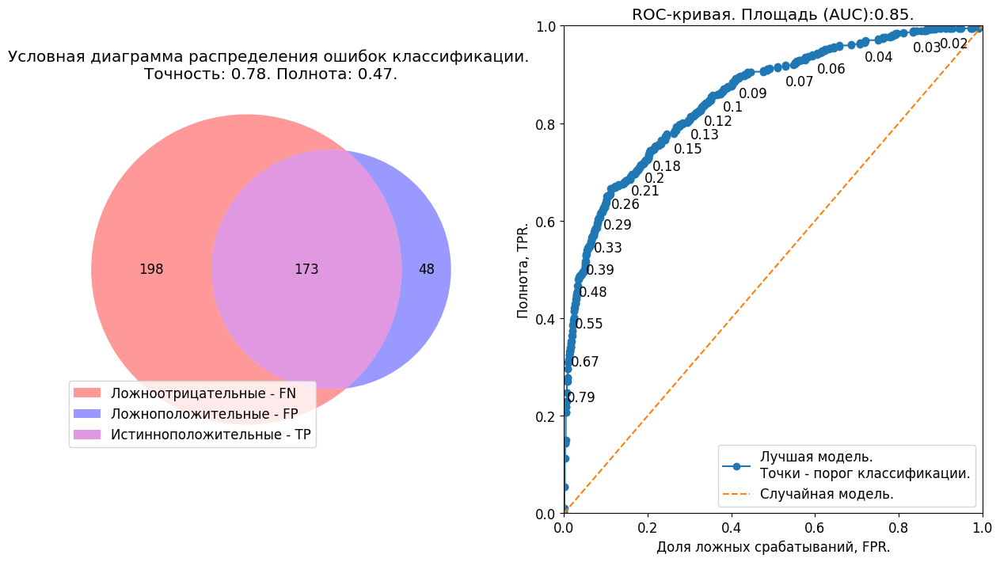

CPU times: total: 13.4 s
Wall time: 16.9 s


In [28]:
%%time
# Вызовем функцию и обучим модели.
params_imbalanced = {'n_jobs' : [-1], 'random_state' : [seed]}

baseline_imbalanced = get_best_model(X_train, y_train, X_val, y_val,
                                     model_classes, params_imbalanced,
                                     thresholds=.5, search_methods='all',
                                     scorer_name='f1',
                                     sec_scorer_name='roc_auc', verbosity=0)

#### **Обучение модели без учёта дисбаланса. Выводы:**
Т.к. алгоритм перебора по сетке с отсеиванием `HalvingGridSearchCV` находит те же модели, что и `GridSearchCV`- исчерпывающий поиск по сетке, и последний существенно замедляет поиск моделей, далее, исключим `GridSearchCV` из конвеера и будем проводить перебор только в цикле и по сетке с отсеиванием, алгоритмом `HalvingGridSearchCV`.

- Худшая оценка у линейного алгоритма логистической регрессии более всего подверженного влиянию несбалансированных классов.
- Модели, основанные на деревьях, справились с дисбалансом, в целом, лучше, а градиентный бустинг даже достиг минимального целевого порога среднего гармонического точности и полноты, f1 меры, - 0.59.
- Судя по графику ROC-кривой, порог классификации метода `predict`, установленный по умолчанию на `0.5`, не оптимален для несбалансированных классов.
- AUC-ROC оценка достаточно высока, что говорит о достаточно высоком качестве модели. Как минимум, уверенно можно сказать, что даже базисная модель на несбалансированной выборке не предсказывает случайно (пунктирная диагональ на графике ROC-кривой - случайно предсказывающая модель).
- Высокая точность и низкая полнота говорят о том, что лучшая модель нечасто ошибается, но редко угадывает положительный класс.
- Необходимо обработать дисбаланс.

## Борьба с дисбалансом.
- Сбалансируем классы.
- Обучим разные модели с подбором гиперпараметров.
- Выберем лучшую модель.

### Гиперпараметр `class_weight` для борьбы с дисбалансом.
- Вызовем функцию поиска моделей с подбором гиперпараметров и указанием гиперпараметра `{"class_weight":"balanced"}`.


Начало работы...


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


Подбор гиперпараметров завершён.





,Алгоритм.,Метод подбора.,Оценка - f1.,Оценка - AUC-ROC,Порог классификации.,Время обучения.
1,RandomForestClassifier,Перебор в цикле.,0.60,0.85,0.50,0.39
3,GradientBoostingClassifier,Перебор в цикле.,0.60,0.85,0.50,1.83
0,DecisionTreeClassifier,Перебор в цикле.,0.56,0.79,0.50,0.05
4,AdaBoostClassifier,Перебор в цикле и кросс-вал.,0.56,0.82,0.50,0.96
2,KNeighborsClassifier,Перебор в цикле.,0.52,0.80,0.50,0.02


,Прогнозируемый класс - положительный..,Прогнозируемый класс - отрицательный.,Кол-во элементов в классе.
Истинный класс - положительный.,TP = 220,FN = 151,371
Истинный класс - отрицательный.,FP = 137,TN = 1311,1448


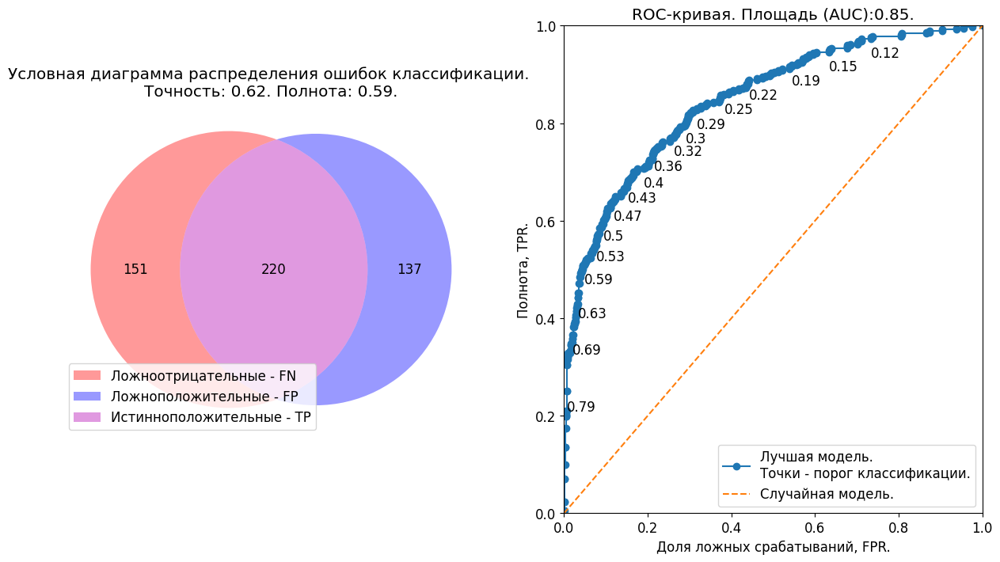

CPU times: total: 2min 29s
Wall time: 2min 20s


In [29]:
%%time
# Создадим список гиперпараметров с включением class_weight.
params_tuned_weighted = params.copy()
params_tuned_weighted.update({'class_weight' : ['balanced']})

# Вызовем функцию и обучим модели.
tuned_weighted = get_best_model(X_train, y_train, X_val, y_val,
                               model_classes, params_tuned_weighted,
                               thresholds=.5,
                               search_methods=['loop', HalvingGridSearchCV],
                               scorer_name='f1',
                               sec_scorer_name='roc_auc', verbosity=0)

#### Гиперпараметр `class_weight`. Выводы:
- Точность и полнота в идеальном балансе, - подтверждение верной оптимизации f1-меры, их гармонического среднего.
- Логистическая регрессия отразила результат взвешивания классов: целевая метрика - мера f1, почти в два раза выше, чем для невзвешенной модели. Это демонстрация зависимости качества линейных алгоритмов от дисбаланса.
- Нелинейные модели, показали те же или лучшие результаты, что и без взвешивания классов, т.к. они меньше или вовсе не зависят от дисбаланса.
- Высшая оценка по целевой метрике модели случайного леса выше оценки лучшей базисной модели градиентного бустинга: 0.63 у сбалансированного гиперпараметром `balanced` случайно леса, против 0.59 лучшей базисной модели. Это показатель важности подбора гиперпараметров.
- Оценка AUC-ROC практически не отреагировала на изменение баланса классов, что говорит о целесообразности использования f1-меры (в некоторых случаях и fbeta меры) для оценки несбалансированных выборок.

### Создание функции ресэмплинга выборок.
Создадим функцию ресэмплинга выборок, которая
- _примет на вход_
  - предикторы и целевой признак;
  - опционально, коэффициент увеличения/уменьшения выборки;
  - метод ресэмплинга: увеличение или уменьшение выборки;
- рассчитает коэффициент ресэмплинга по соотношению классов в выборке, если он не введён;
- увеличит положительный (миноритарный) / уменьшит отрицательный (мажоритарный) класс;
- _выведет_ предикторы и целевой признак с преобразованными классами предварительно сбросив индексы.


In [30]:
def resample(X, y, ratio='auto', resample_method=None):
    '''
    Upsamples or downsamples X (features) and y (target) for
    imbalanced classes.
    Arguments:
    - X, y - features, target.
    - ratio. upsample ratio:int of float; downsample ratio:float. Choose one.
    default: 'auto'. 'auto' upsamples or downsamples according to class ratios
    in target.
    - resample_method: str, default: None. Choose 'upsample', 'downsample'
    to resample accordingly.
    '''
    # Проверим ввод верного метода ресэмплинга.
    if not isinstance(resample_method, str):
        raise ValueError('Метод преобразования указан неверно.')

    # Проверим ввод коэффициентов и рассчитаем их при необходимости.
    if ratio == 'auto':
        up_ratio = round(sum(y_train == 0) / sum(y_train == 1))
        down_ratio = round(1/up_ratio, 2)

    # Разделим классы.
    X_zeros = X[y == 0]
    X_ones = X[y == 1]
    y_zeros = y[y == 0]
    y_ones = y[y == 1]

    # Увеличим долю положительного класса.
    if resample_method == 'upsample':

        if (ratio != 'auto' and \
            isinstance(ratio, float) or \
            isinstance(ratio, int)):
            up_ratio = ratio

        X_up = pd.concat([X_zeros] + [X_ones] * up_ratio)
        y_up = pd.concat([y_zeros] + [y_ones] * up_ratio)

        # Перемешаем выборки.
        X_re, y_re = shuffle(X_up, y_up, random_state=seed)

        # Переиндкесируем выборки.
        for sample in [X_re, y_re]:
            sample.reset_index(drop=True, inplace=True)

        return X_re, y_re

    # Уменьшим долю отрицательного класса.
    elif resample_method == 'downsample':

        if ratio != 'auto' and isinstance(ratio, float):
            down_ratio = ratio

        X_down = pd.concat(
            [X_zeros.sample(frac=down_ratio, random_state=seed)] +
             [X_ones])
        y_down = pd.concat(
            [y_zeros.sample(frac=down_ratio, random_state=seed)] +
             [y_ones])

        # Перемешаем выборки.
        X_re, y_re = shuffle(X_down, y_down, random_state=seed)

        # Переиндкесируем выборки.
        for sample in [X_re, y_re]:
            sample.reset_index(drop=True, inplace=True)

        return X_re, y_re

### Увеличение выборки для борьбы с дисбалансом.
- Вызовем функцию ресэмплинга с параметром `upsample` и увеличим положительный класс обучающей выборки.
- Проверим результат.

In [31]:
# Вызовем функцию с параметров `upsample` и увеличим выборку.
X_train_up, y_train_up = resample(X_train, y_train, resample_method='upsample')

        ## Выведем соотношение классов.
display(
    pd.DataFrame(
        data={
            f'Положительный класс в %. ({names_rus["key_1"]})' :
            f'{y_train_up.value_counts(normalize=True)[1]:.1%}',
            f'Отрицательный класс в %. ({names_rus["key_0"]})' :
            f'{y_train_up.value_counts(normalize=True)[0]:.1%}',
            'Уникальные значения классов.' :
            str(list(y_train_up.unique())).strip("'[]"),
            'Количество объектов отрицательного класса.' : sum(y_train_up == 0),
            'Количество объектов положительного класса.' : sum(y_train_up == 1),
            'Общее количество объектов после увеличения.' : X_train_up.shape[0],
            },
        index=['Значение:']
        )
    .style
    .set_caption('Классы после увеличения выборки (upsampling).')
    .set_table_styles(styles)
    )

# Выведем первые строки новых предикторов и целевого признака.
print('\n\nПервые строки увеличенных обучающей выборки и целевого признака:')
display(X_train_up.head())
print('\n')
display(y_train_up.to_frame().head())

,Положительный класс в %. (Клиент ушёл.),Отрицательный класс в %. (Клиент не ушёл.),Уникальные значения классов.,Количество объектов отрицательного класса.,Количество объектов положительного класса.,Общее количество объектов после увеличения.
Значение:,50.6%,49.4%,"0, 1",4342,4448,8790




Первые строки увеличенных обучающей выборки и целевого признака:


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,-0.240014,-0.848513,-0.691009,0.830766,0.820395,1,1,-1.042525,1.0,0.0,1.0
1,0.151987,0.560995,0.003630,1.259817,0.820395,1,0,-0.838351,1.0,0.0,0.0
2,-0.993070,-0.378677,1.045587,-1.240299,0.820395,1,1,1.346425,0.0,0.0,0.0
3,0.286093,0.936864,-1.038328,0.640375,-0.907853,1,0,1.666061,1.0,0.0,1.0
4,-0.002750,-0.472645,-0.343689,0.464623,-0.907853,0,1,0.755502,0.0,0.0,1.0


,exited
0,0
1,1
2,0
3,1
4,0


- Увеличение выборки "апсемплингом" проведено.
- Соотношение классов оптимально с учётом неделимости объектов: положительный класс - 50.6%, отрицательный класс - 49.4%.
- Найдём модели с высшими значениями целевой метрики и проверим результаты.


Начало работы...


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


Подбор гиперпараметров завершён.





,Алгоритм.,Метод подбора.,Оценка - f1.,Оценка - AUC-ROC,Порог классификации.,Время обучения.
1,RandomForestClassifier,Перебор в цикле.,0.61,0.85,0.50,0.28
3,GradientBoostingClassifier,Перебор в цикле.,0.60,0.85,0.50,1.05
4,AdaBoostClassifier,Перебор в цикле.,0.57,0.84,0.50,1.19
2,KNeighborsClassifier,Перебор в цикле.,0.56,0.80,0.50,0.03
0,DecisionTreeClassifier,Перебор в цикле.,0.55,0.79,0.50,0.05


,Прогнозируемый класс - положительный..,Прогнозируемый класс - отрицательный.,Кол-во элементов в классе.
Истинный класс - положительный.,TP = 246,FN = 125,371
Истинный класс - отрицательный.,FP = 195,TN = 1253,1448


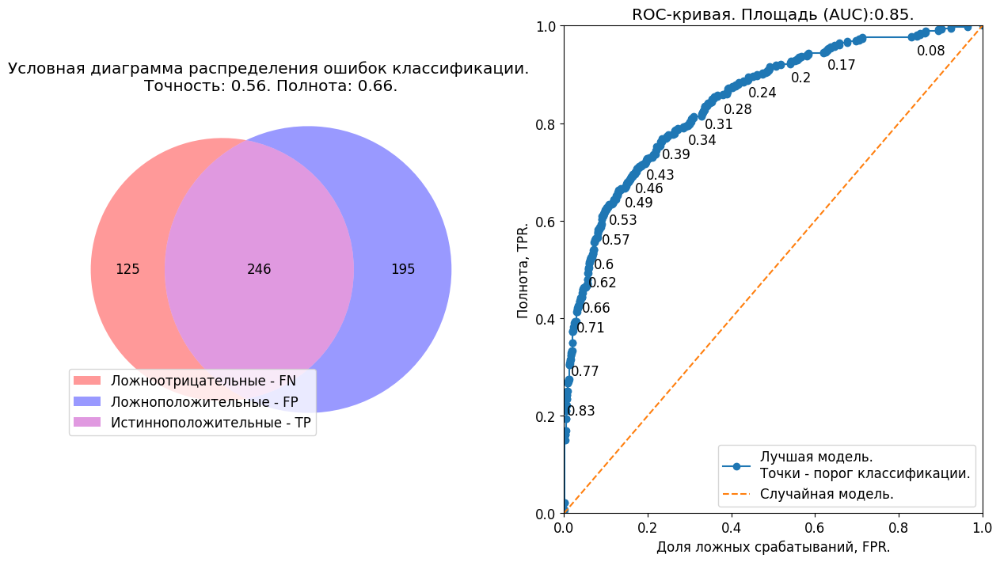

CPU times: total: 2min 55s
Wall time: 2min 49s


In [32]:
%%time
# Вызовем функцию и обучим модели.
tuned_upsampled = get_best_model(X_train_up, y_train_up, X_val, y_val,
                                 model_classes, params,
                                 thresholds=.5,
                                 search_methods=['loop', HalvingGridSearchCV],
                                 scorer_name='f1',
                                 sec_scorer_name='roc_auc', verbosity=0)

#### Увеличение выборки. Выводы:
- Как и ожидалось, с увеличением кол-ва образцов положительного класса, увеличилось количество истинноположительных ответов. А количество ложнополжительных ответов увеличилось в несколько раз. Т.е. увеличив выборку на основе только имеющихся данных мы добавили моделям не только уверенности, но и шума.
- Случайный лес показал одинаковый результат с методом автоматической балансировки, а результаты градиентного бустинга лучше за счёт большого количества ложноположительных ответов, снижения точности.
- По матрице ошибок классификации можно сказать, что модель начала точнее предсказывать отрицательный класс, что не идеально.
- AUC-ROC - неизменна, т.к. по сути мы не вносим существенных изменений, которые может задетектировать эта метрика, т.е. взаимосвязь полноты и доли ложных срабатываний не изменяются для одного и того же алгоритма, примерно одинаковых гиперпараметров и одной и той же выборки.

### Уменьшение выборки для борьбы с дисбалансом.
- Вызовем функцию ресэмплинга с параметром `downsample` и уменьшим отрицательный класс обучающей выборки.
- Проверим результат.

In [33]:
# Вызовем функцию с параметров `upsample` и увеличим выборку.
X_train_down, y_train_down = resample(X_train, y_train, resample_method='downsample')

        ## Выведем соотношение классов.
display(
    pd.DataFrame(
        data={
            f'Положительный класс в %. ({names_rus["key_1"]})' :
            f'{y_train_down.value_counts(normalize=True)[1]:.1%}',
            f'Отрицательный класс в %. ({names_rus["key_0"]})' :
            f'{y_train_down.value_counts(normalize=True)[0]:.1%}',
            'Уникальные значения.' :
            str(list(y_train_down.unique())).strip("'[]"),
            'Количество объектов отрицательного класса.' : sum(y_train_down == 0),
            'Количество объектов положительного класса.' : sum(y_train_down == 1),
            'Общее количество объектов после уменьшения.' : X_train_down.shape[0],
            },
        index=['Значение:']
        )
    .style
    .set_caption('Классы после уменьшения выборки (downsampling).')
    .set_table_styles(styles)
    )

# Выведем первые строки новых предикторов и целевого признака.
print('\n\nПервые строки увеличенных предикторов и целевого признака:')
display(X_train_down.head(3))
print('\n')
display(y_train_down.to_frame().head(3))

,Положительный класс в %. (Клиент ушёл.),Отрицательный класс в %. (Клиент не ушёл.),Уникальные значения.,Количество объектов отрицательного класса.,Количество объектов положительного класса.,Общее количество объектов после уменьшения.
Значение:,50.6%,49.4%,"0, 1",1086,1112,2198




Первые строки увеличенных предикторов и целевого признака:


,credit_score,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_Germany,geography_Spain,gender_Male
0,2.060416,-0.942481,-1.385647,-1.240299,0.820395,0,0,0.930441,0.0,0.0,1.0
1,-0.590753,-1.130415,1.740226,-1.240299,2.548644,0,0,-0.090639,0.0,1.0,1.0
2,1.101044,0.748930,-0.691009,0.862550,-0.907853,1,0,0.770093,0.0,0.0,1.0


,exited
0,0
1,1
2,0


- Уменьшение выборки "даунсэмплингом" проведено.
- Соотношение классов в процентах: положительный класс - 50.6%, отрицательный класс - 49.4%.
- Найдём модели с высшими значениями целевой метрики и проверим результаты.


Начало работы...


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


Подбор гиперпараметров завершён.





,Алгоритм.,Метод подбора.,Оценка - f1.,Оценка - AUC-ROC,Порог классификации.,Время обучения.
1,RandomForestClassifier,Перебор в цикле.,0.59,0.84,0.50,0.29
3,GradientBoostingClassifier,Перебор в цикле.,0.59,0.85,0.50,0.61
4,AdaBoostClassifier,Перебор в цикле и кросс-вал.,0.58,0.84,0.50,0.54
2,KNeighborsClassifier,Перебор в цикле и кросс-вал.,0.57,0.82,0.50,0.01
0,DecisionTreeClassifier,Перебор в цикле.,0.53,0.76,0.50,0.02


,Прогнозируемый класс - положительный..,Прогнозируемый класс - отрицательный.,Кол-во элементов в классе.
Истинный класс - положительный.,TP = 273,FN = 98,371
Истинный класс - отрицательный.,FP = 276,TN = 1172,1448


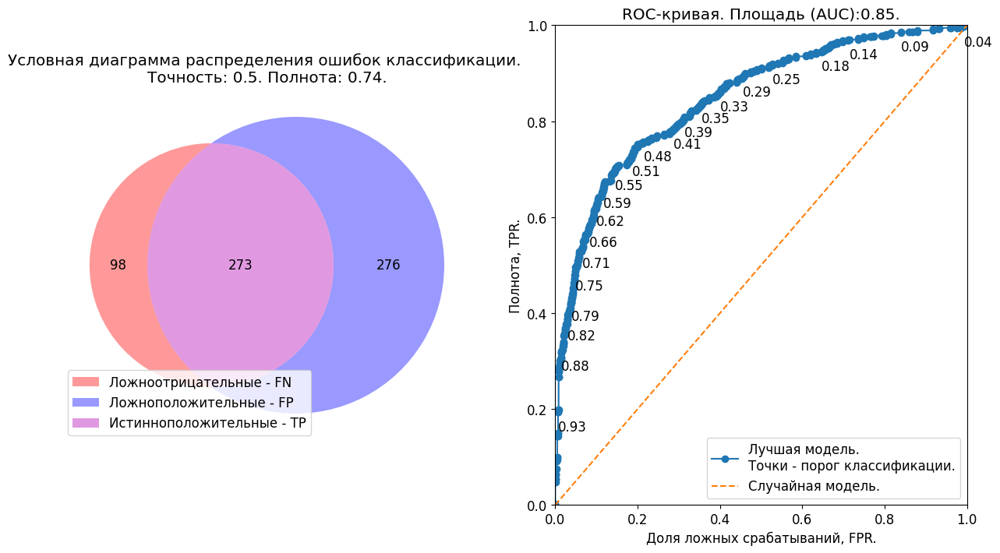

CPU times: total: 1min 16s
Wall time: 1min 15s


In [34]:
%%time
# Вызовем функцию и обучим модели.
tuned_downsampled = get_best_model(X_train_down, y_train_down, X_val, y_val,
                                   model_classes, params,
                                   thresholds=.5,
                                   search_methods=['loop', HalvingGridSearchCV],
                                   scorer_name='f1',
                                   sec_scorer_name='roc_auc', verbosity=0)

#### Уменьшение выборки. Выводы:
- Результаты "даунсэмплинга" хуже по сравнению с двумя предыдущими методами. Это ожидаемо, т.к. вместе с размером выборки мы уменьшаем количество информации, которую могут использовать модели в обучении.
- Скорее всего, данный метод подойдёт для трансформации больших выборок.

### Изменение порога классификации для борьбы с дисбалансом.
- Вызовем функцию перебора гиперпараметров с указанием списка порогов классификации для проверки.


Начало работы...


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


Подбор гиперпараметров завершён.





,Алгоритм.,Метод подбора.,Оценка - f1.,Оценка - AUC-ROC,Порог классификации.,Время обучения.
3,GradientBoostingClassifier,Перебор в цикле и кросс-вал.,0.63,0.85,0.30,1.84
1,RandomForestClassifier,Перебор в цикле.,0.61,0.85,0.35,0.38
2,KNeighborsClassifier,Перебор в цикле.,0.58,0.81,0.30,0.02
4,AdaBoostClassifier,Перебор в цикле.,0.56,0.82,0.50,0.95
0,DecisionTreeClassifier,Перебор в цикле и кросс-вал.,0.54,0.75,0.20,0.04


,Прогнозируемый класс - положительный..,Прогнозируемый класс - отрицательный.,Кол-во элементов в классе.
Истинный класс - положительный.,TP = 228,FN = 143,371
Истинный класс - отрицательный.,FP = 127,TN = 1321,1448


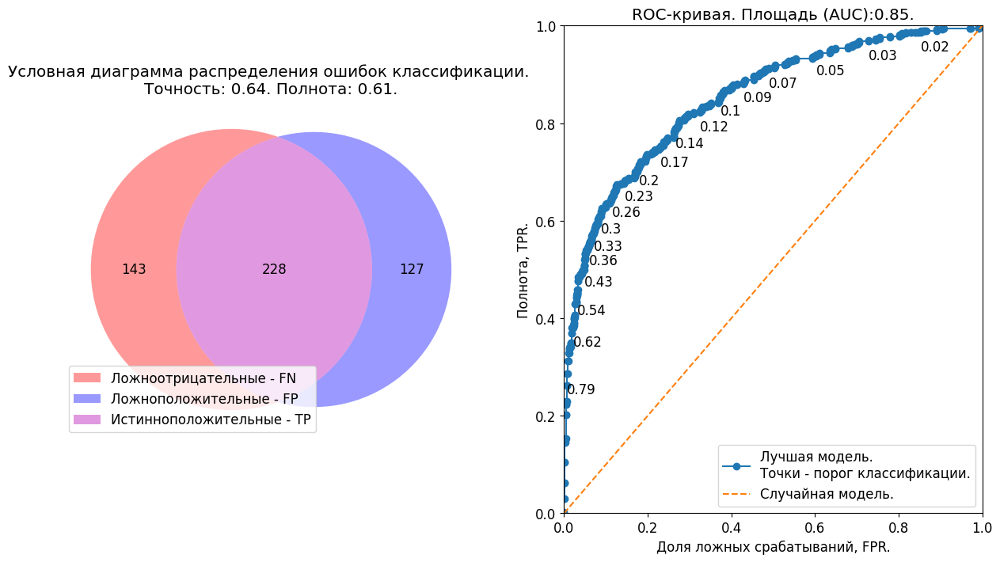

CPU times: total: 2min 32s
Wall time: 2min 22s


In [35]:
%%time
# Вызовем функцию и обучим модели.
tuned_cut_off = get_best_model(X_train, y_train, X_val, y_val,
                               model_classes, params,
                               thresholds=np.arange(.1, .55, .05),
                               search_methods=['loop', HalvingGridSearchCV],
                               scorer_name='f1',
                               sec_scorer_name='roc_auc', verbosity=0)

#### Изменение порога классификации. Выводы:
- Метод показал лучшие оценки целевой метрики для градиентного бустинга, хорошую оценку случайного леса, практически идеальный баланс точности и полноты и максимальное отношение истинноположительных ответов к ложноположительным.
- Порог классификации смещён в левую часть графика (FPR=0.09, TPR=0.63).
- Модель с лучшим показателем целевой метрики - случайный лес. Воспользуемся ей и проведём тестирование.

### Борьба с дисбалансом. Выводы:
- Наиболее эффективные методы борьбы с дисбалансом классов в порядке убывания:
  - `thresholding`, поиск оптимального порога классификации;
  - автоматическое вычисление отношения классов с помощью гиперпараметра `balanced`;
  - `oversampling` - увеличение выборки случайным сэмплированием;
  - `undersampling` - уменьшение выборки, скорее всего, эффективно только для больших выборок.
- Модель с лучшим значением целевой метрики - случайный лес.

## Тестирование модели.
- Проверим качество модели случайного леса
  - с порогом классификации 0.3;
  - с подобранными гиперпараметрами.

In [36]:
# Проверим качество модели.
proba_final = tuned_cut_off.predict_proba(X_test)[:, 1] > 0.3
rc_score_final = roc_auc_score(y_test,
                               tuned_cut_off.predict_proba(X_test)[:, 1])
print('Оценка f1-меры лучшей модели случайного леса на ' +
      f'тестовой выборке: {round(f1_score(y_test, proba_final), 2)}')
print('Оценка AUC-ROC лучшей модели случайного леса на ' +
      f'тестовой выборке: {round(rc_score_final, 2)}')
print('Гиперпараметры лучшей модели:')
display(tuned_cut_off)

Оценка f1-меры лучшей модели случайного леса на тестовой выборке: 0.63
Оценка AUC-ROC лучшей модели случайного леса на тестовой выборке: 0.87
Гиперпараметры лучшей модели:


GradientBoostingClassifier(n_estimators=150, random_state=42)

- Значение f1-меры лучшей модели случайного леса на тестовой выборке: 0.63
- Модель успешно преодолела минимальный порог целевой метрики 0.59.
- Оценка AUC-ROC 0.87 показывает адекватность модели.

## Общие выводы:
#### **Исследовательский анализ данных. Выводы:**

- **Целевой признак определен и бинарен. Задача построения предиктивной модели сводится к бинарной классификации, "обучению с учителем".**<br><br>
-  **Искомый порог целевой метрики был преодолён.**
  - **Финальное значение f1 меры: 0.63.**
  - **Модель с высшей оценкой целевой метрики: случайный лес.**<br><br>
- **Данные были изучены и предобработаны:**
  - Данные содержат 10000 объектов, описанных 5-ю количественными и 6-ю качественными признаками.
  - В данных также присутствуют идентификаторы пользователей и индексы объектов, которые были удалены перед моделированием.
  - Целевой признак - `exited`, категориальный, бинарный, классы несбалансированы с соотношением
    - ≈20% - положительный класс,
    - ≈80% - отрицательный. <br>
    Несбалансированность классов была учтена при разделении выборок.
  - Явных пропусков в данных не обнаружено.
  Были удалены 9% пропусков в признаке `tenure`.
  - Дубликатов в данных не обнаружено.
  - Существенной корреляции предикторов, мультиколлинеарности, не обнаружено.<br><br>
  
- **Были исследованы распределения предикторов и сделаны следующие выводы:**
    - Процент нелояльных клиентов ≈20% - высокий процет для банковской сферы в среднем.
    - Чем ниже рейтинг клиента, тем вероятнее его уход.
    - Больше всего клиентов в общем и лояльных во Франции. Больше всего нелояльных, и в абcолютных, и в относительных значениях, в Германии.
    - Более молодые люди (медианный возраст ≈31 год) более лояльны.
    - Наличие кредитной карты:
    Ушедших клиентов - держателей кредитных карт больше. Почти половина клиентов имеют кредитные карты и не держат деньги на счетах.
    - Активность: активные клиенты уходят от банка реже.
    - Количество продуктов, используемых клиентом:
    Оптимальное количество продуктов - 2. Возможно, имеет смысл повышение привлекательности именно двух продуктов.<br><br>
    
- **Была проведена подготовка к моделированию:**
  - Было проведено стратифицированное разделение на обучающую (60%), валидационную (20%) и тестовую (20%) выборки.
  - Было проведено кодирование качественных признаков:
    - `geography`;
    - `gender`.
  - Было произведено масштабирование количественных признаков:
    - `credit_score`;
    - `age`;
    - `tenure`;
    - `balance`;
    - `num_of_products`;
    - `estimated_salary`.
  - Была проведена дополнительная проверка признаков, после кодирования-масштабирования. Значимой мультиколинеарности не обнаружено.<br><br>
  
- **Были рассмотрены способы борьбы с дисбалансом классов:**
  - Автоматизированное вычисление соотношения классов с использованием гиперпараметра `balanced`.<br>
  Метод эффективен, что подвердилось высокими значениями оценок f1 меры разных моделей.
  - Увеличение выборки, `upsampling`. <br>
  Метод относительно эффективен, вносит в данные относительно большое количество шума. Средние оценки f1 меры.
  - Уменьшение выборки, `downsampling`.<br>
  Метод неэффективен для относительно небольшых выборок.
  - Подбор оптимального порога классификации или `thresholding`.<br>
  Метод показал лушие оценки целевой метрики f1 для всех алгоритмов, практически идеальный баланс точности и полноты и максимальное отношение истинноположительных ответов к ложноположительным.<br><br>
  
- **Было проведено тестирование:**
  - Оценка целевой метрики на тестовой выборке была произведена с использованием случайного леса, наиболее эффективной модели, построенной методом подбора оптимального порога классификации и гиперпараметров.
  - Оценка AUC-ROC 0.87 показала адекватность модели.
  - _Искомый порог целевой метрики был преодолён. Финальное значение f1 меры: 0.63_.